In [1]:
from modul.mvccsql import MVCCSQL
import pandas as pd
import os
import json

# Увеличить максимальное количество отображаемых столбцов
pd.set_option('display.max_columns', None)  # или число, например 50
# Увеличить ширину строки вывода
pd.set_option('display.width', 1000)
# Увеличить максимальное количество символов в ячейке
pd.set_option('display.max_colwidth', None)


os.makedirs("pic", exist_ok=True)

sql = MVCCSQL(BDpath = 'city_info.db')
sql.create_table()

In [2]:
# Создания справочника городов

sheets_to_skip_count = 3
file_path = "EU-27-LAU-2024-NUTS-2024.xlsx"


xls = pd.ExcelFile(file_path)
all_sheet_names = xls.sheet_names
sheets_to_read = all_sheet_names[sheets_to_skip_count:]

print(f"Будут прочитаны листы: {sheets_to_read}")

df_dictionary = pd.read_excel(file_path, sheet_name=sheets_to_read)
required_columns = ['CITY ID', 'CITY NAME']

col = 0
combined_list = []

for sheet_name, df in df_dictionary.items():
    available_cols = [col for col in required_columns if col in df.columns]
    if not available_cols:
        print(f"На листе '{sheet_name}' нет нужных колонок. Пропускаем.")
        continue
    
    df_filtered = df[available_cols].copy()    
    df_cleaned = df_filtered.dropna(subset=available_cols)
    combined_list.append(df_cleaned)
    
    print(f"На листе '{sheet_name}': {available_cols} количество строк:{df_cleaned.shape}")
    col = col + 1

if combined_list:
    final_df = pd.concat(combined_list, ignore_index=True)
    final_df['CITY NAME'] = final_df['CITY NAME'].str.replace(" (greater city)", "", regex=False)
    final_df['CITY NAME'] = final_df['CITY NAME'].str.replace(": greater city", "", regex=False)
    final_df = final_df.drop_duplicates(subset=['CITY ID', 'CITY NAME'])
else:
    final_df = pd.DataFrame()  # пустой, если ничего не найдено

# cc_df = final_df.drop_duplicates(subset=['CITY ID', 'CITY NAME'])

print(final_df.head(30))
print(f"количество:{col} итого:{final_df.shape}")


sql.insert_code_city(final_df)

Будут прочитаны листы: ['BE', 'BG', 'CZ', 'DK', 'DE', 'EE', 'IE', 'EL', 'ES', 'FR', 'HR', 'IT', 'CY', 'LV', 'LT', 'LU', 'HU', 'MT', 'NL', 'AT', 'PL', 'PT', 'RO', 'SI', 'SK', 'FI', 'SE', 'LI', 'NO', 'CH', 'MK', 'TR']
На листе 'BE': ['CITY ID', 'CITY NAME'] количество строк:(65, 2)
На листе 'BG': ['CITY ID', 'CITY NAME'] количество строк:(14, 2)
На листе 'CZ': ['CITY ID', 'CITY NAME'] количество строк:(17, 2)
На листе 'DK': ['CITY ID', 'CITY NAME'] количество строк:(18, 2)
На листе 'DE': ['CITY ID', 'CITY NAME'] количество строк:(127, 2)
На листе 'EE': ['CITY ID', 'CITY NAME'] количество строк:(3, 2)
На листе 'IE': ['CITY ID', 'CITY NAME'] количество строк:(42, 2)
На листе 'EL': ['CITY ID', 'CITY NAME'] количество строк:(101, 2)
На листе 'ES': ['CITY ID', 'CITY NAME'] количество строк:(0, 2)
На листе 'FR': ['CITY ID', 'CITY NAME'] количество строк:(0, 2)
На листе 'HR': ['CITY ID', 'CITY NAME'] количество строк:(6, 2)
На листе 'IT': ['CITY ID', 'CITY NAME'] количество строк:(0, 2)
На лист

0

In [3]:
#Создаем справочник "разрезов"/Lable

import pandas as pd
from modul.mvccsql import MVCCSQL

file_path = "urb_esms_an_3.xlsx"
df_dictionary = pd.read_excel(file_path, sheet_name="Variables ")
required_columns = ['Variable Code', 'Label']
final_df = df_dictionary[required_columns].copy()
final_df['Label'] = final_df['Label'].str.replace("Population on the 1st of January,", "", regex=False).str.strip()

print(final_df.head(10))

sql.insert_population_code(final_df)

  Variable Code               Label
0       DE1001V               total
1       DE1002V                male
2       DE1003V              female
3       DE1040V    0-4 years, total
4       DE1041V     0-4 years, male
5       DE1042V   0-4 years, female
6       DE1074V    5-9 years, total
7       DE1075V     5-9 years, male
8       DE1076V   5-9 years, female
9       DE1077V  10-14 years, total


In [4]:
# Заполнение таблицы с данными по городам, годам, возрастным группам

import pandas as pd
import numpy as np


file_path = "estat_urb_cpop1.tsv"
df = pd.read_csv(file_path, sep='\t')

df[['freq', 'variable_code_id', 'city_id']] = df['freq,indic_ur,cities\TIME_PERIOD'].str.split(',', expand=True)
df= df.drop(columns=['freq', 'freq,indic_ur,cities\TIME_PERIOD'])

print(df.head(3))

# Преобразуем в длинный формат
year_columns = [col for col in df.columns if col != 'variable_code_id' or col != 'city_id']
df_long = df.melt(
    id_vars=['variable_code_id', 'city_id'],    # колонка(-и), которые остаются как есть
    value_vars=year_columns,                    # колонки-годы, которые "расплавятся"
    var_name='year',                            # имя новой колонки для годов
    value_name='value'                          # имя новой колонки для значений
)

df_long['value'] = pd.to_numeric(df_long['value'], errors='coerce').astype('Int64')
# 3. Замена NaN на None (для совместимости с sqlite3)
df_long = df_long.astype(object).where(pd.notnull(df_long), None)

print(df_long.shape)
print("Строк в DataFrame:", len(df_long))
print("Уникальных ключей (предположим):", 
      df_long[['variable_code_id', 'city_id', 'year']].drop_duplicates().shape[0])
data = df_long[['variable_code_id', 'city_id', 'year', 'value']].values.tolist()


sql.insert_estat_urb_cpop1(df_long)

  1989  1990      1991      1992      1993      1994      1995      1996       1997       1998       1999       2000      2001      2002  2003      2004      2005      2006      2007      2008      2009  2010  2011  2012      2013      2014  2015  2016  2017  2018  2019  2020  2021  2022  2023  2024  variable_code_id city_id
0    :     :   7795786   7867796   7962003   8015027   8039865   8054802    8067812    8075425    7992323    8011566   8032875   8083797     :   8140122   8201359   8254298   8282984   8318592   8355260     :     :     :   8451860   8507786     :     :     :     :     :     :     :     :     :     :           DE1001V      AT
1    :     :   1539848         :         :         :         :   1595402   1609631 p  1606843 p  1608144 p  1615438 p  1550123         :     :   1598626   1632569   1652449   1661246   1674909   1687271     :     :     :   1741246   1766746     :     :     :     :     :     :     :     :     :     :           DE1001V  AT001C
2    :     :    237

2153772

City count:78
NL001C - Amsterdam
BE002C - Antwerpen
NL008C - Arnhem
DE031C - Augsburg
SK003C - Banská Bystrica
DE001C - Berlin
DE016C - Bielefeld
DE015C - Bochum
DE032C - Bonn
SK001C - Bratislava
DE012C - Bremen
BE006C - Brugge
BE001C - Bruxelles/Brussel
HU001C - Budapest
BG004C - Burgas
BE004C - Charleroi
DE023C - Darmstadt
DE010C - Dortmund
DE011C - Düsseldorf
NL014C - Eindhoven
NL015C - Enschede
DE030C - Erfurt
FI005C - Espoo/Esbo
DE006C - Essen
DE027C - Frankfurt (Oder)
DE005C - Frankfurt am Main
DE025C - Freiburg im Breisgau
BE003C - Gent
NL018C - Groningen
SE002C - Göteborg
DE020C - Göttingen
DE017C - Halle an der Saale
DE002C - Hamburg
DE013C - Hannover
NL022C - Heerlen
FI001C - Helsinki/Helsingfors
FI009C - Jyväskylä
DE033C - Karlsruhe
SK002C - Košice
FI008C - Kuopio
DE004C - Köln
FI007C - Lahti/Lahtis
CY001C - Lefkosia
BE005C - Liège
DE018C - Magdeburg
DE035C - Mainz
SE003C - Malmö
HU002C - Miskolc
DE022C - Moers
DE034C - Mönchengladbach
DE021C - Mülheim a.d.Ruhr
DE003C - Münc

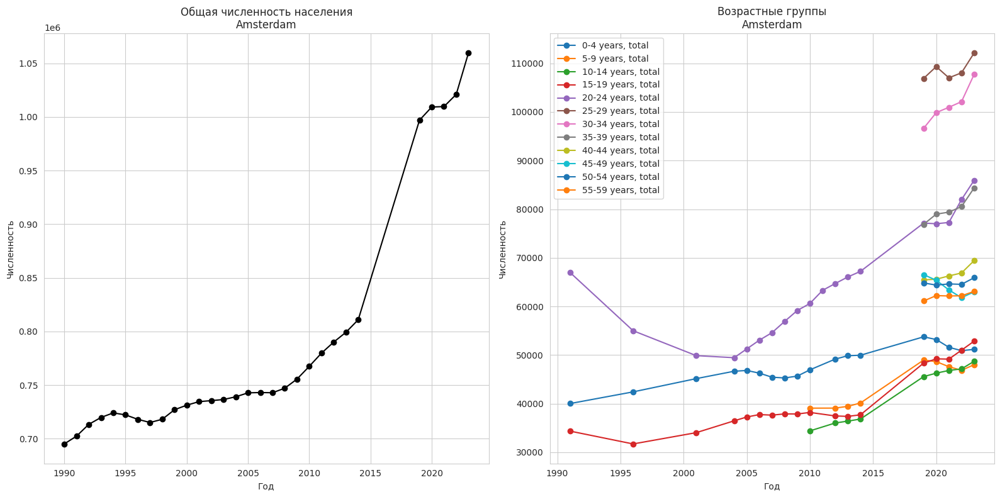

Antwerpen


<Figure size 1000x600 with 0 Axes>

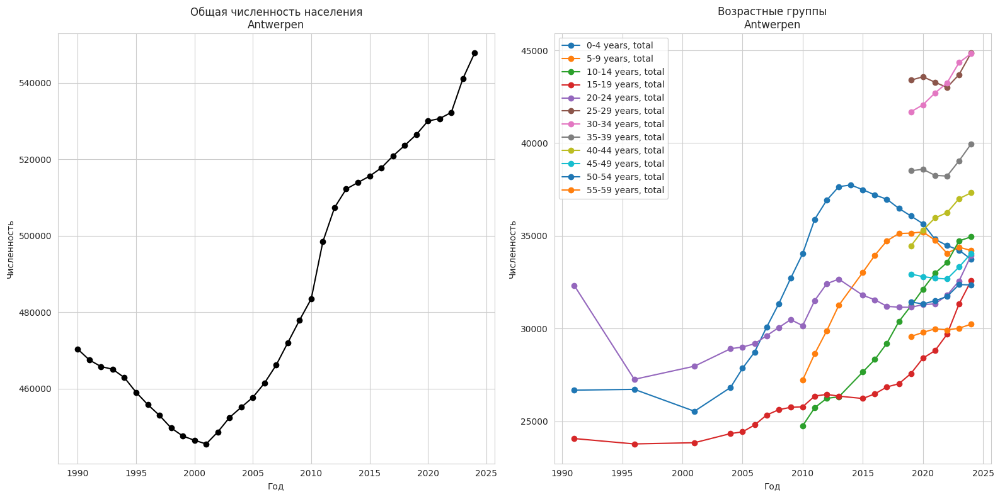

Arnhem


<Figure size 1000x600 with 0 Axes>

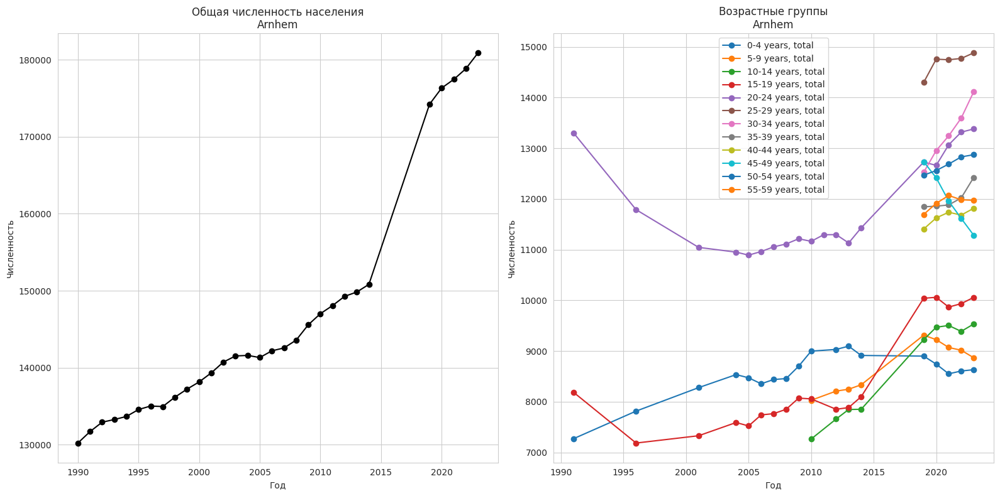

Augsburg


<Figure size 1000x600 with 0 Axes>

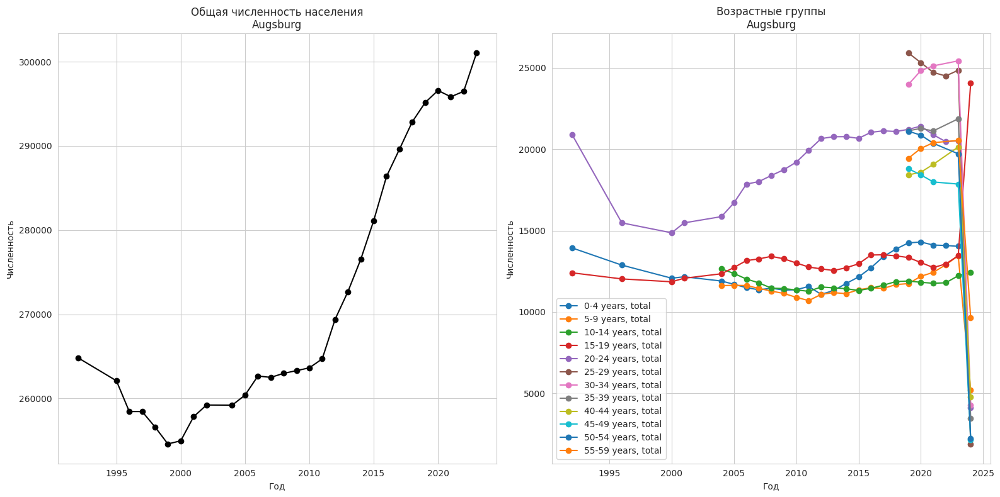

Banská Bystrica


<Figure size 1000x600 with 0 Axes>

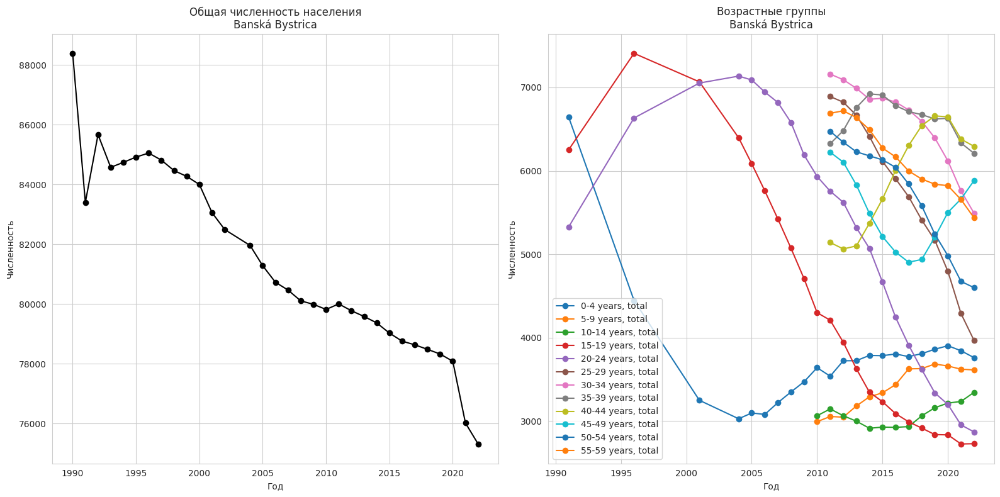

Berlin


<Figure size 1000x600 with 0 Axes>

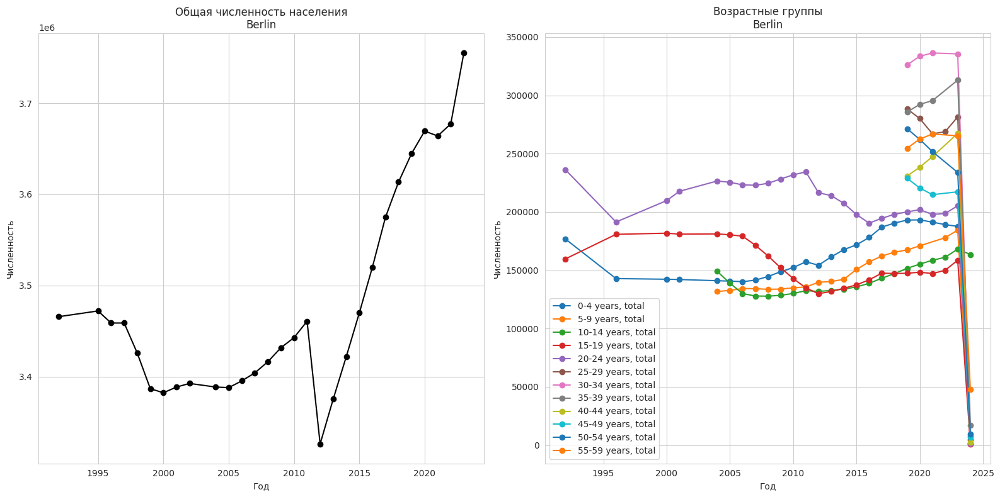

<Figure size 1000x600 with 0 Axes>

In [5]:
# Поиск городов с «нормальной» статистикой

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re

sql = MVCCSQL(BDpath = 'city_info.db')
# === 1. Список городов ===
# city_ids = [
#     'BE002C', 'BE006C', 'BE001C',
#     # 'BE004C',
#     'FI005C',
#     'BE003C', 'FI001C', 'FI009C', 'FI008C', 'FI007C',
#     'BE005C', 'FI004C', 'FI002C', 'FI003C', 'FI006C'
# ]

# Первичная выборка городов с данными по более чем 25 лет
city_query = f"""
SELECT lcc.city_id, lcc.city_name, COUNT(DISTINCT euc.year)
FROM estat_urb_cpop1 AS euc
JOIN lau_code_city AS lcc ON euc.city_id = lcc.city_id
JOIN variable_code AS pc ON euc.variable_code_id = pc.code_id
WHERE 
    euc.value IS NOT NULL
    AND euc.year BETWEEN 1989 AND 2024
    AND lcc.city_name IS NOT NULL
    
GROUP BY lcc.city_name
HAVING COUNT(DISTINCT euc.year) > 25;  -- 2024 - 1989 + 1 = 3
"""
df_city = sql.sql_to_df(city_query)
city_ids = df_city['city_id'].tolist()

print(f"City count:{len(city_ids)}")
for _, row in df_city.iterrows():
    print(f"{row['city_id']} - {row['city_name']}")
print("*"*20)

# Преобразуем в строку для SQL
city_ids_str = ', '.join(f"'{cid}'" for cid in city_ids)

# получить данные только для выбранных городов и total
query = f"""
    SELECT 
        euc.year,
        euc.value,
        lcc.city_name,
        lcc.city_id,
        pc.label
    FROM estat_urb_cpop1 AS euc
    JOIN lau_code_city AS lcc ON euc.city_id = lcc.city_id
    JOIN variable_code AS pc ON euc.variable_code_id = pc.code_id
    WHERE 
        euc.value IS NOT NULL
    --    AND euc.year BETWEEN 1989 AND 2024  -- или 1989–2024, уточните
        AND lcc.city_id IN ({city_ids_str})
        AND pc.label LIKE '%total%'
    ORDER BY lcc.city_name, euc.year
"""

df = sql.sql_to_df(query)
print(f"Current data len -------------")
print(df.head(15))

# ===============================================================================================
# строим графики чтобы наглядно проверить данные по городам
total_tmp = df[df['label'] == 'total'].copy()
total_by_year = total_tmp.groupby(['city_name', 'city_id', 'year'])['value'].sum().reset_index()
total_by_year.rename(columns={'value': 'total_population'}, inplace=True)

print("----- total_by_year")
print(total_by_year.shape)
print(total_by_year.head(10))

# По возрастным группам
grouped_by_age = df.copy()
grouped_by_age['label'] = grouped_by_age['label'].str.strip()
print(grouped_by_age['label'].unique())

# ===  Построение графиков ===
sns.set_style("whitegrid")
cities = total_by_year['city_name'].unique()

max_pic = 5

for i, city in enumerate(cities):
    if i > max_pic:
        break
    # Фильтруем данные для города
    print(city)
    pop_total = total_by_year[total_by_year['city_name'] == city]
    pop_by_age = grouped_by_age[grouped_by_age['city_name'] == city]
    
    # === График 1: общая динамика ===
    plt.figure(figsize=(16, 8))
    
    plt.subplot(1, 2, 1)
    plt.plot(pop_total['year'], pop_total['total_population'], marker='o', color='black')
    plt.title(f'Общая численность населения\n{city}')
    plt.xlabel('Год')
    plt.ylabel('Численность')
    plt.grid(True)
    
    # === График 2: по возрастным группам ===
    plt.subplot(1, 2, 2)
    for group in ["0-4 years, total", "5-9 years, total", '10-14 years, total', '15-19 years, total', '20-24 years, total', '25-29 years, total', '30-34 years, total', '35-39 years, total', '40-44 years, total',
                  '45-49 years, total', '50-54 years, total', '55-59 years, total']:
        subset = pop_by_age[pop_by_age['label'] == group]
        if not subset.empty:
            plt.plot(subset['year'], subset['value'], marker='o', label=group)
    
    plt.title(f'Возрастные группы\n{city}')
    plt.xlabel('Год')
    plt.ylabel('Численность')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    # plt.savefig(f"pic/demography_{city.replace('/', '_')}.png", dpi=150)
    plt.show()
    
    plt.figure(figsize=(10, 6))


City count:9
Current head----------
    year     value   city_name city_id               label
0   1990  169851.0  Espoo/Esbo  FI005C               total
1   1990   12491.0  Espoo/Esbo  FI005C    0-4 years, total
2   1990   10456.0  Espoo/Esbo  FI005C  15-19 years, total
3   1990   12366.0  Espoo/Esbo  FI005C  20-24 years, total
4   1990   12417.0  Espoo/Esbo  FI005C    5-9 years, total
5   1990   12085.0  Espoo/Esbo  FI005C  10-14 years, total
6   1990   14700.0  Espoo/Esbo  FI005C  25-29 years, total
7   1990   15236.0  Espoo/Esbo  FI005C  30-34 years, total
8   1990   15779.0  Espoo/Esbo  FI005C  35-39 years, total
9   1990   17943.0  Espoo/Esbo  FI005C  40-44 years, total
10  1990   12056.0  Espoo/Esbo  FI005C  45-49 years, total
11  1990    9055.0  Espoo/Esbo  FI005C  50-54 years, total
12  1990    7179.0  Espoo/Esbo  FI005C  55-59 years, total
13  1990    5877.0  Espoo/Esbo  FI005C  60-64 years, total
14  1990    4494.0  Espoo/Esbo  FI005C  65-69 years, total
----------

total gr

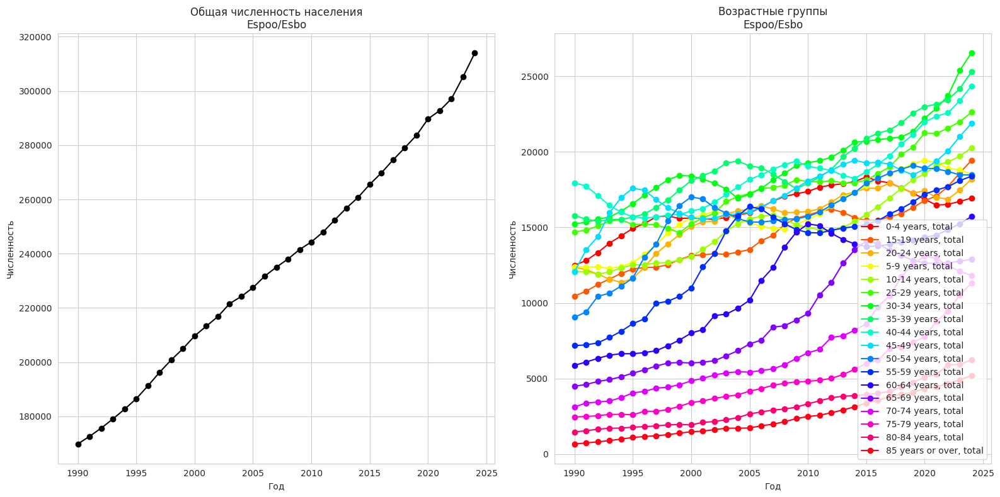

<Figure size 1000x600 with 0 Axes>

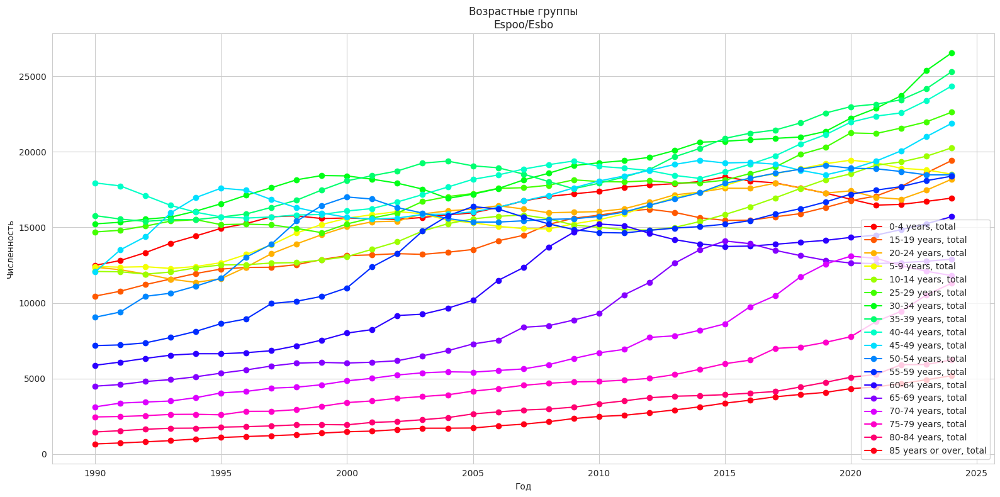

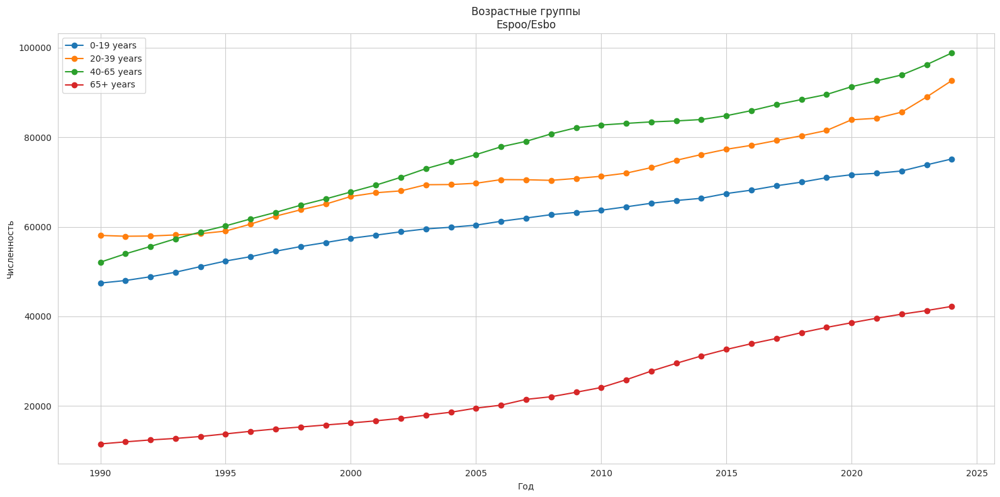

Helsinki/Helsingfors


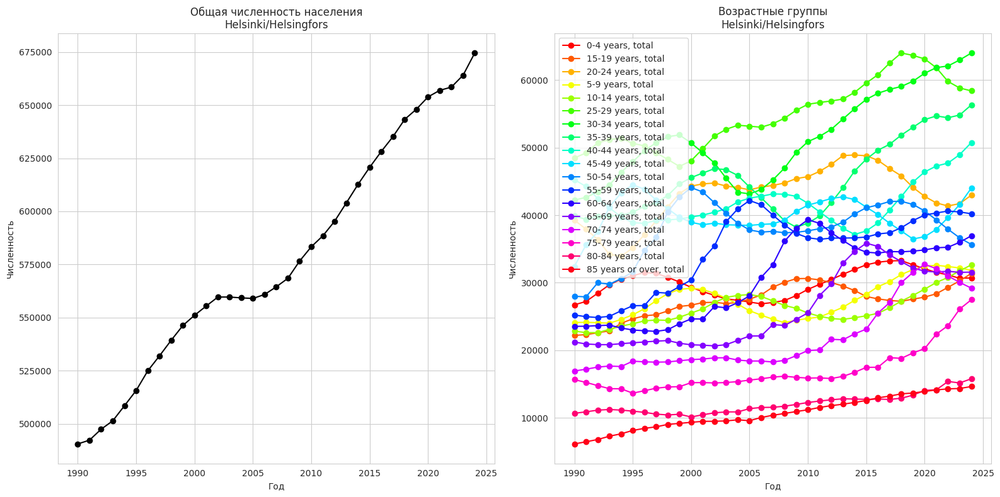

<Figure size 1000x600 with 0 Axes>

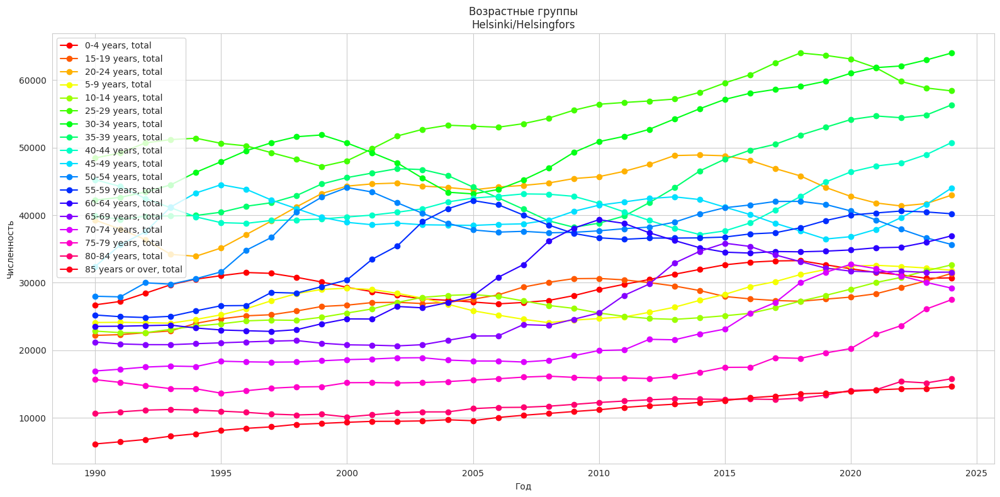

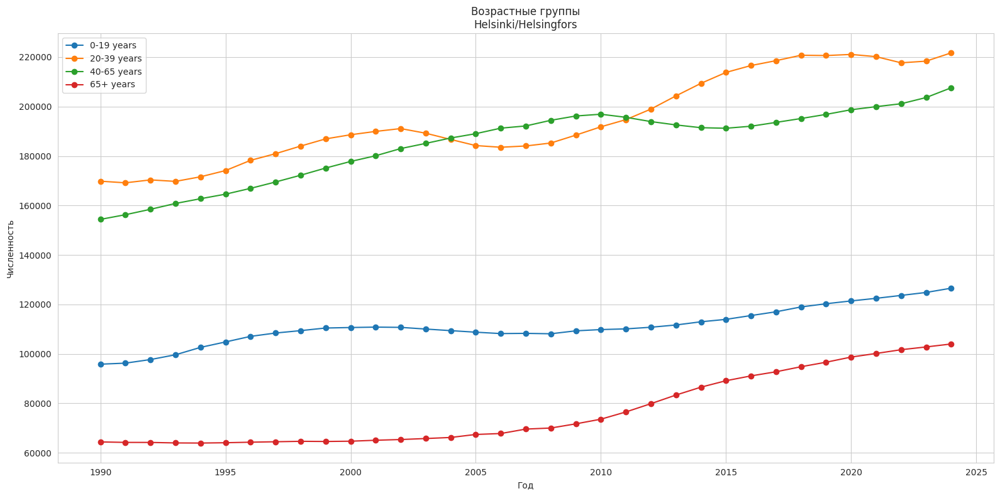

Jyväskylä


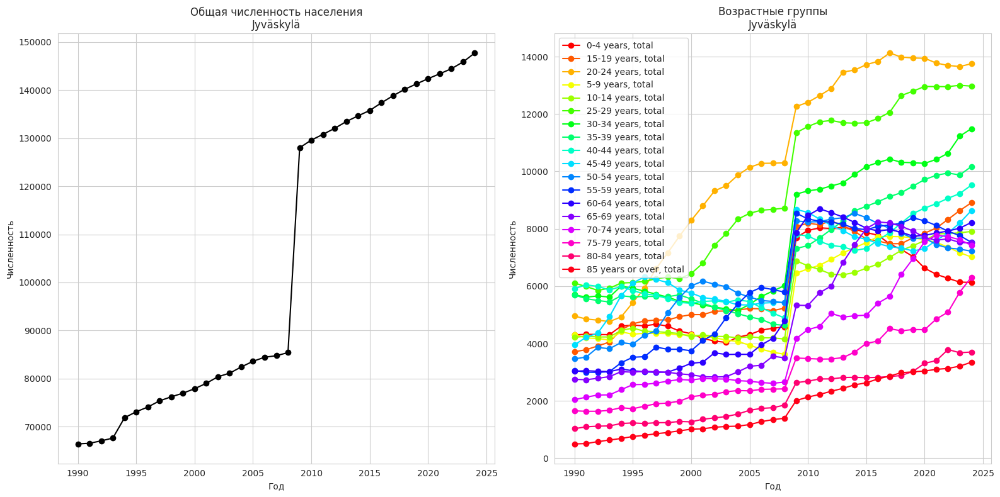

<Figure size 1000x600 with 0 Axes>

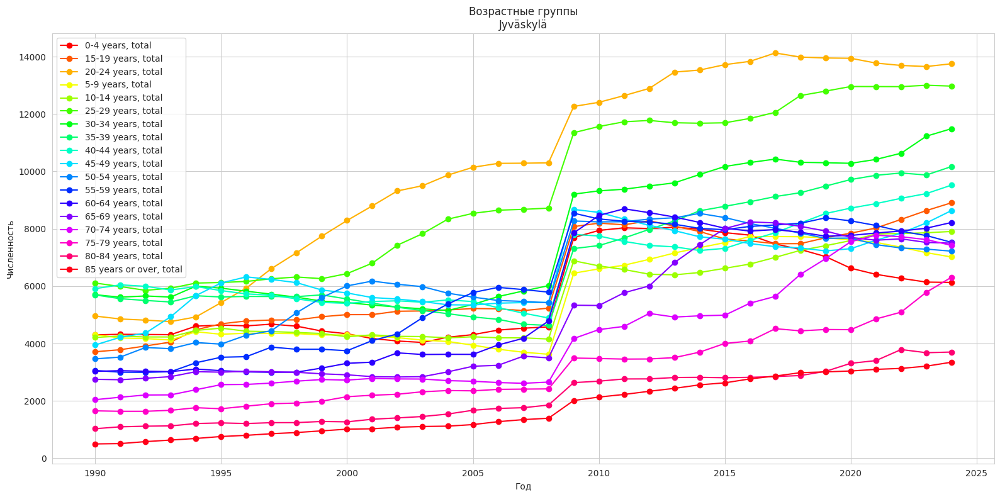

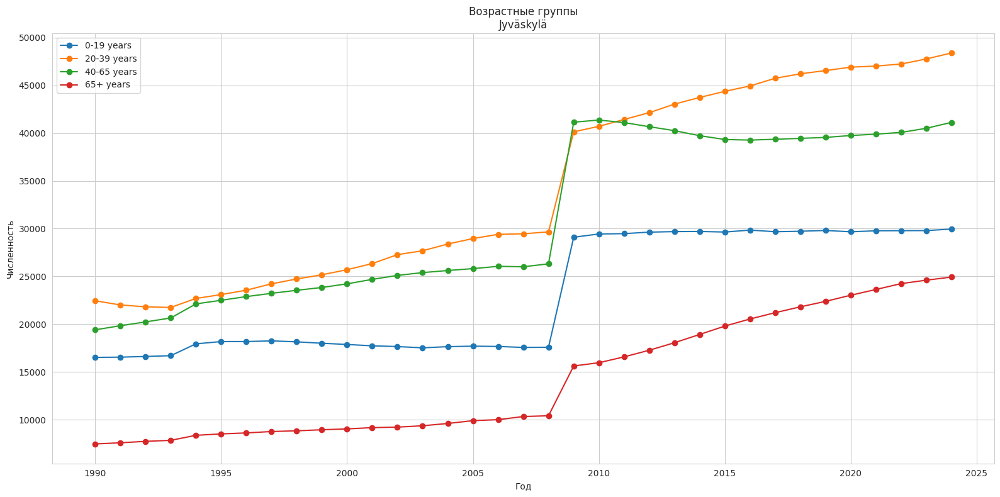

Kuopio


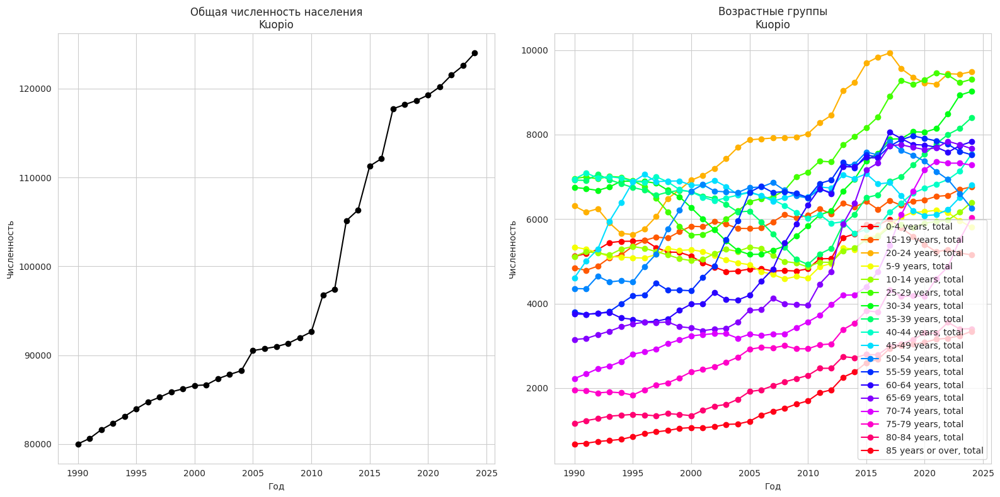

<Figure size 1000x600 with 0 Axes>

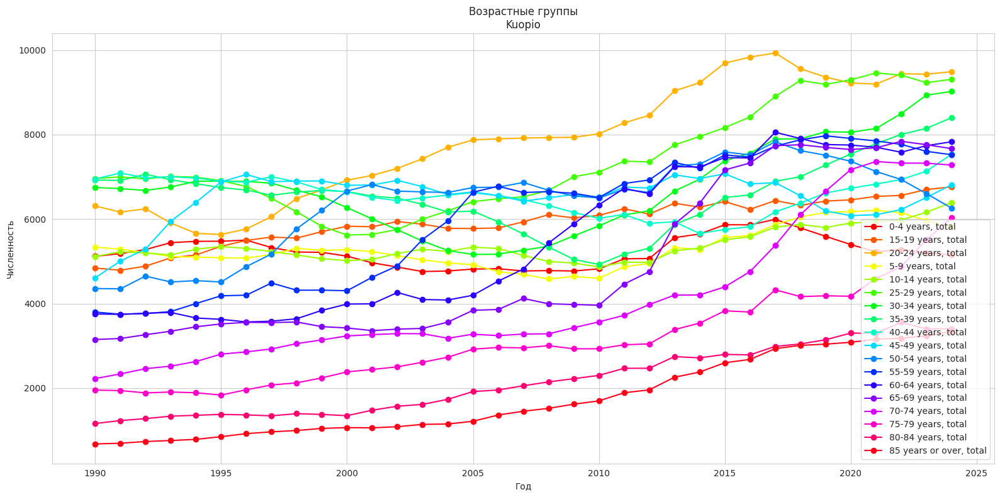

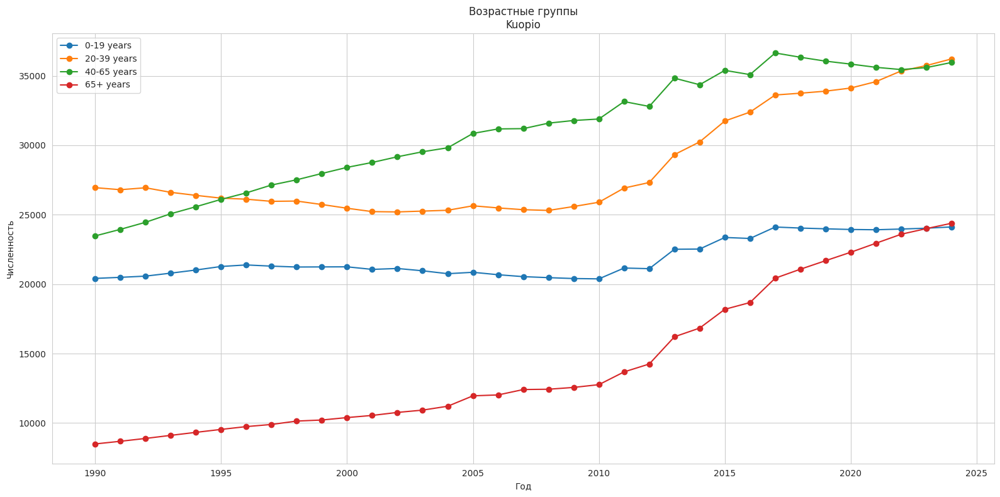

Lahti/Lahtis


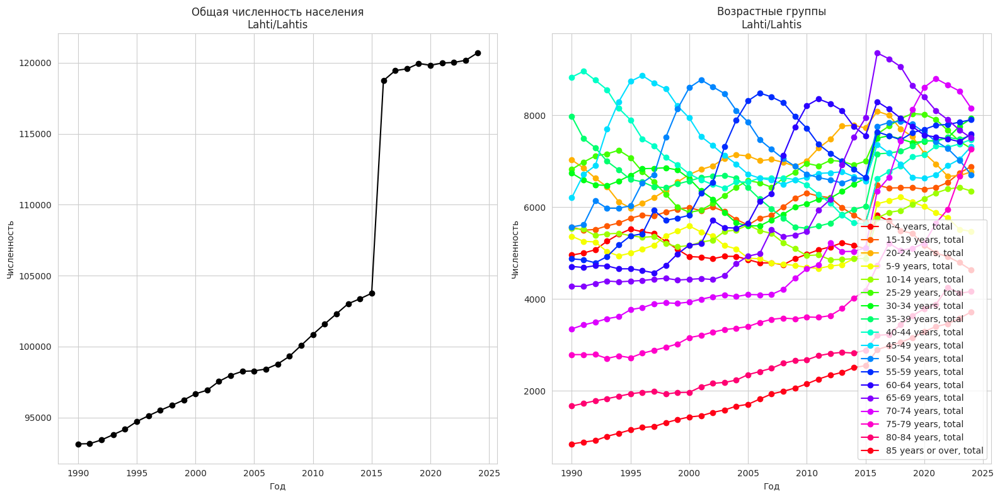

<Figure size 1000x600 with 0 Axes>

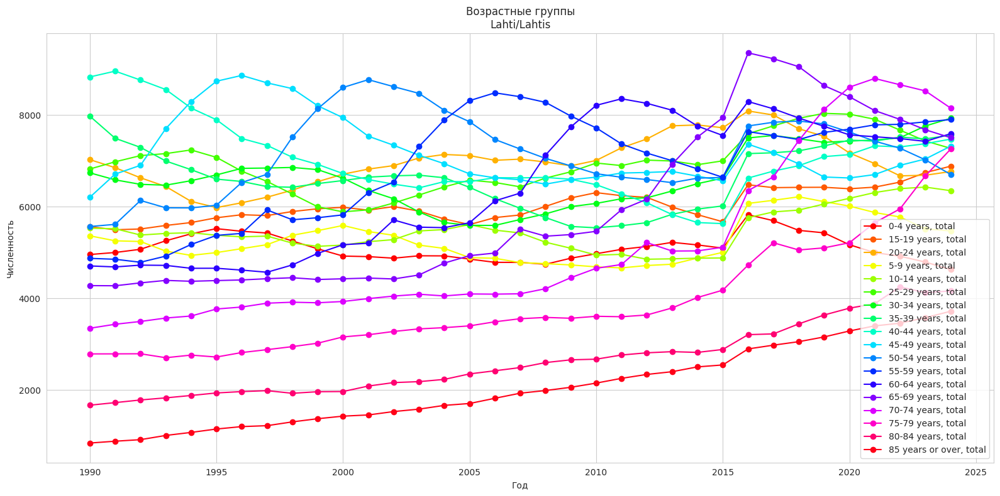

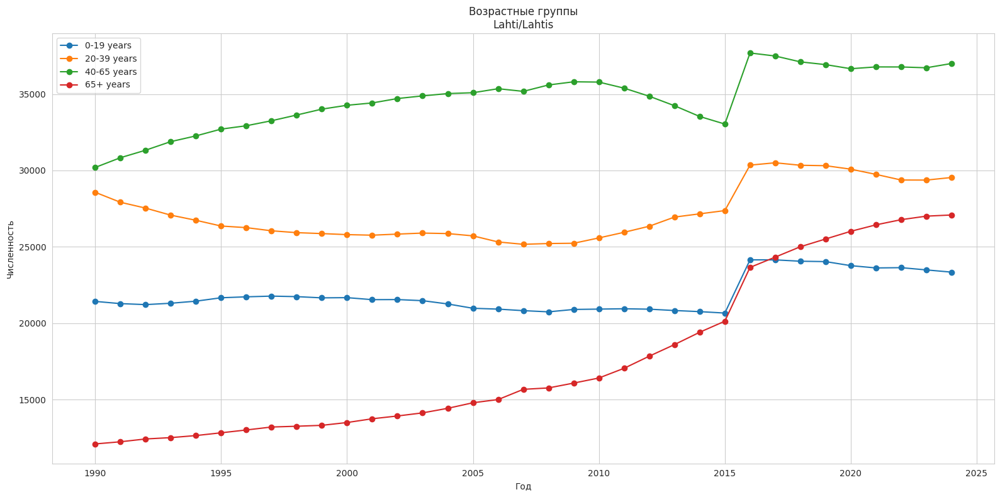

Oulu/Uleåborg


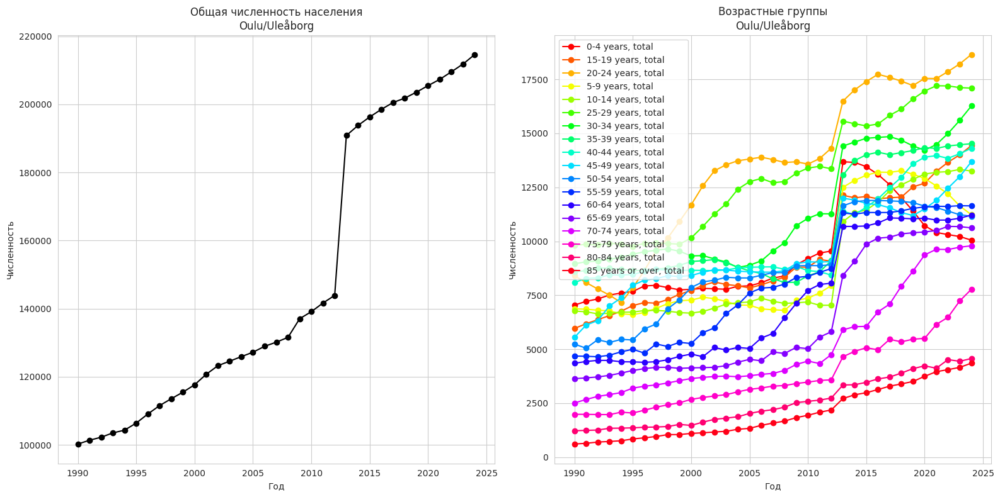

<Figure size 1000x600 with 0 Axes>

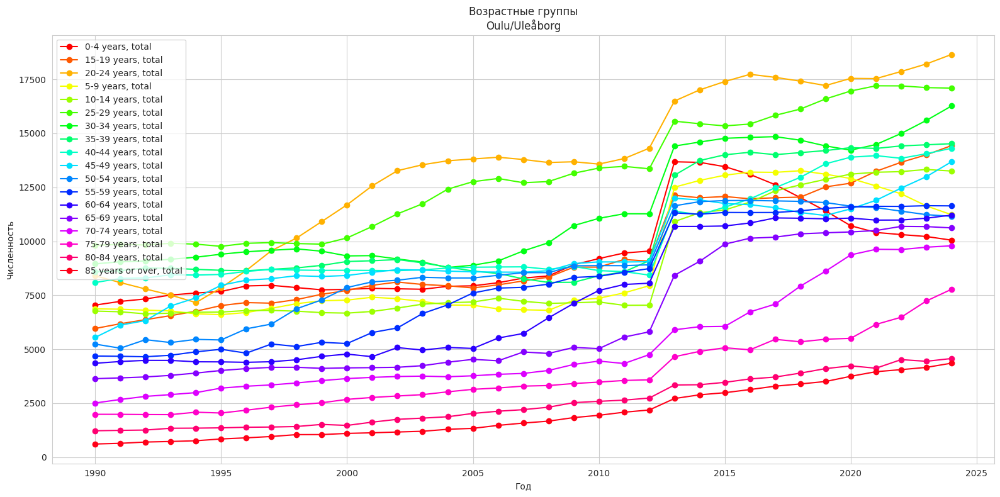

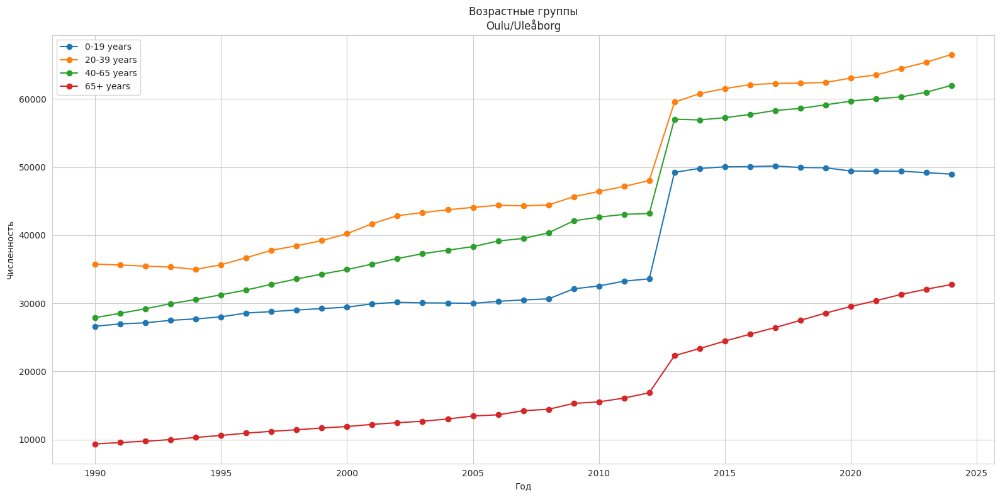

Tampere/Tammerfors


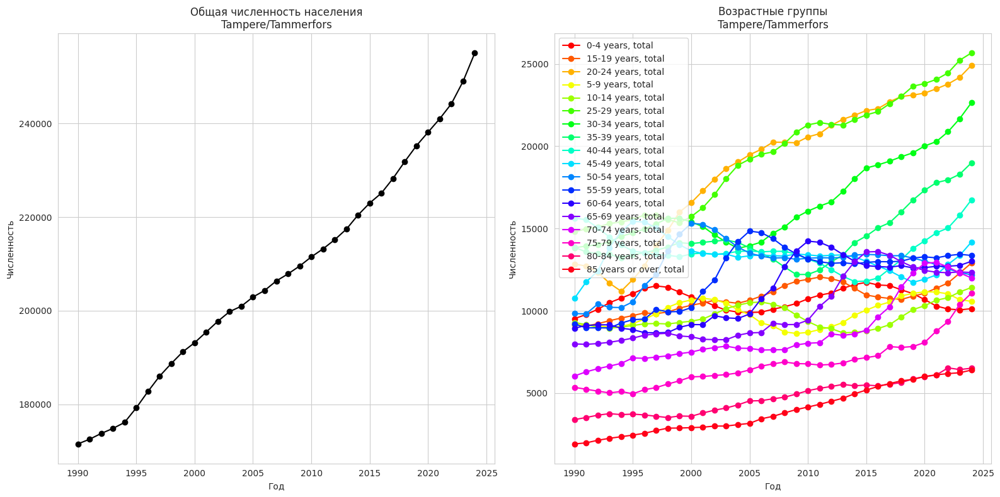

<Figure size 1000x600 with 0 Axes>

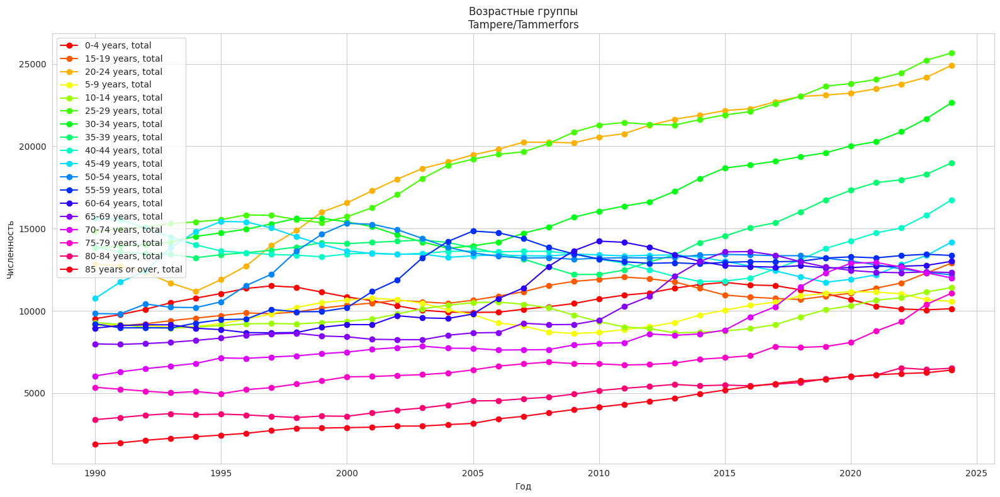

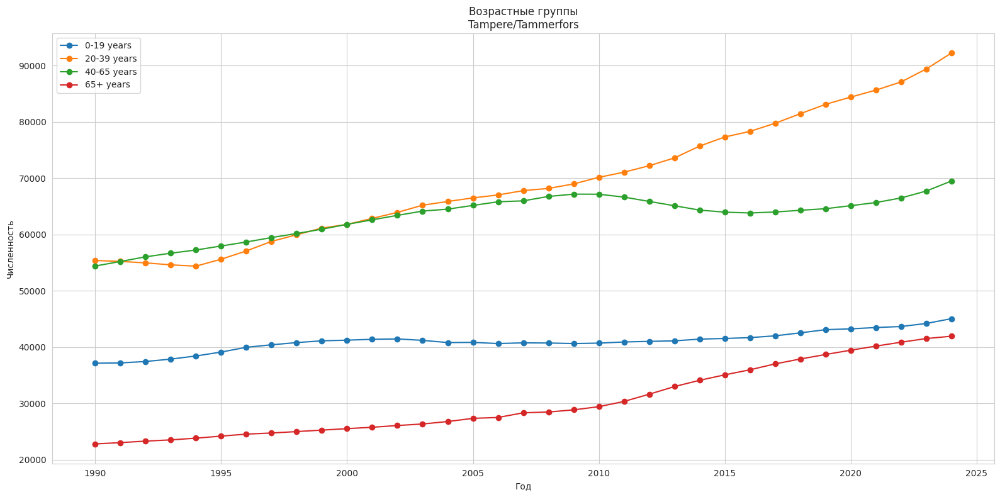

Turku/Åbo


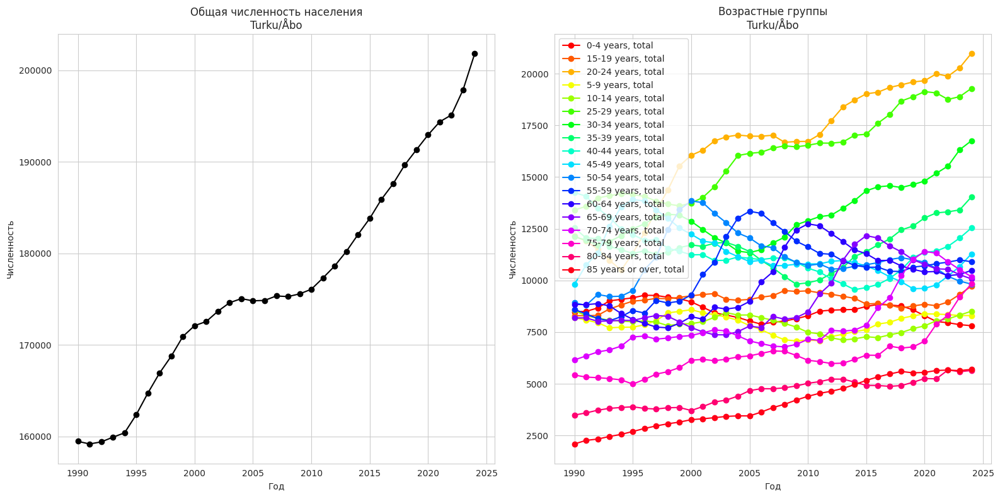

<Figure size 1000x600 with 0 Axes>

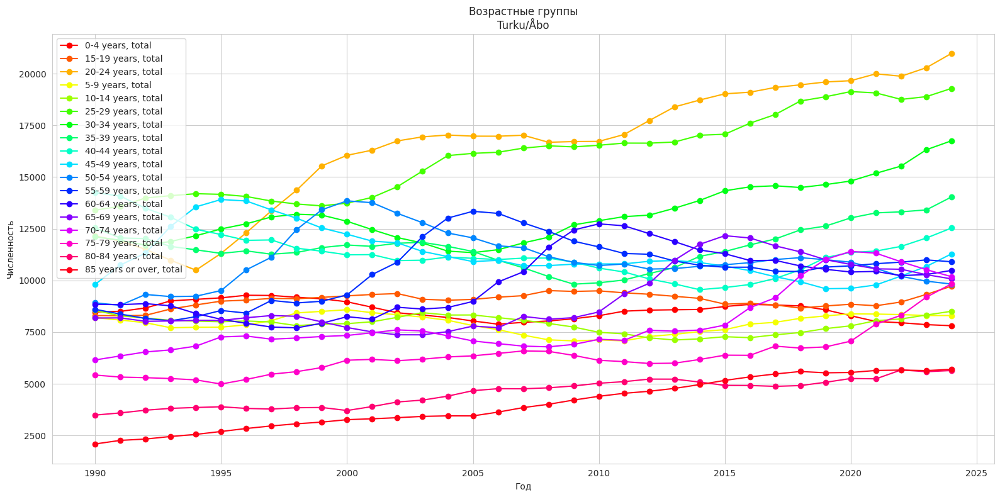

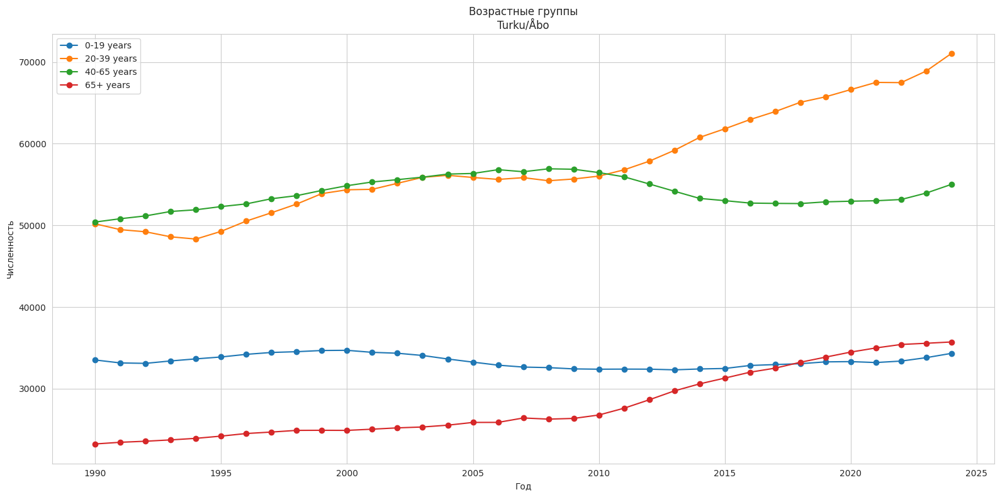

Vantaa/Vanda


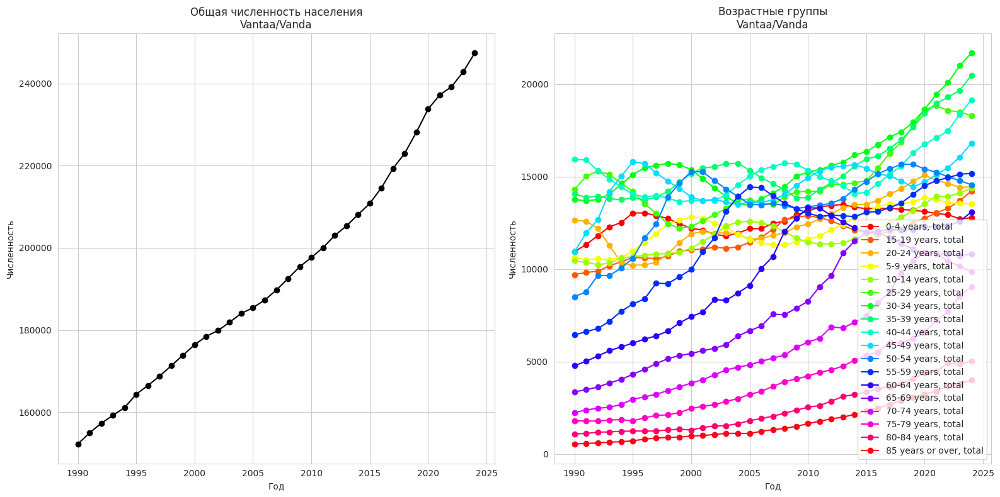

<Figure size 1000x600 with 0 Axes>

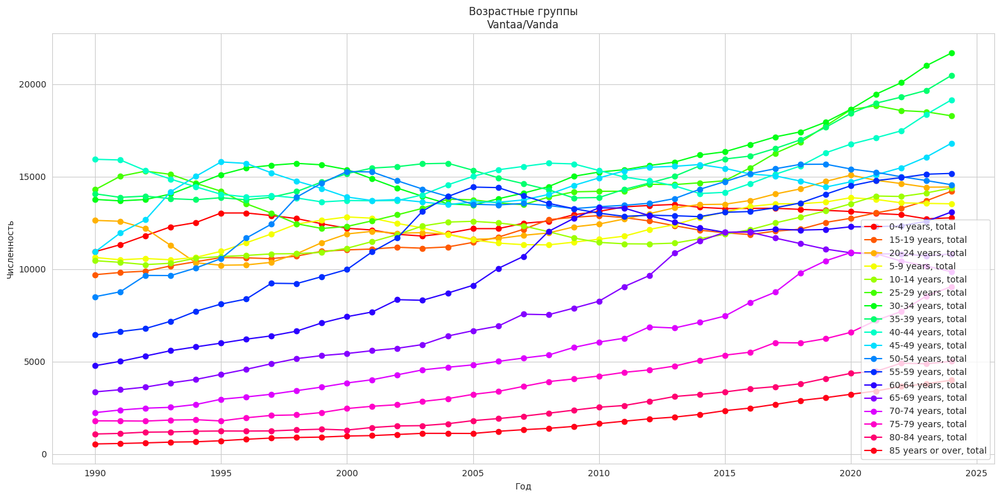

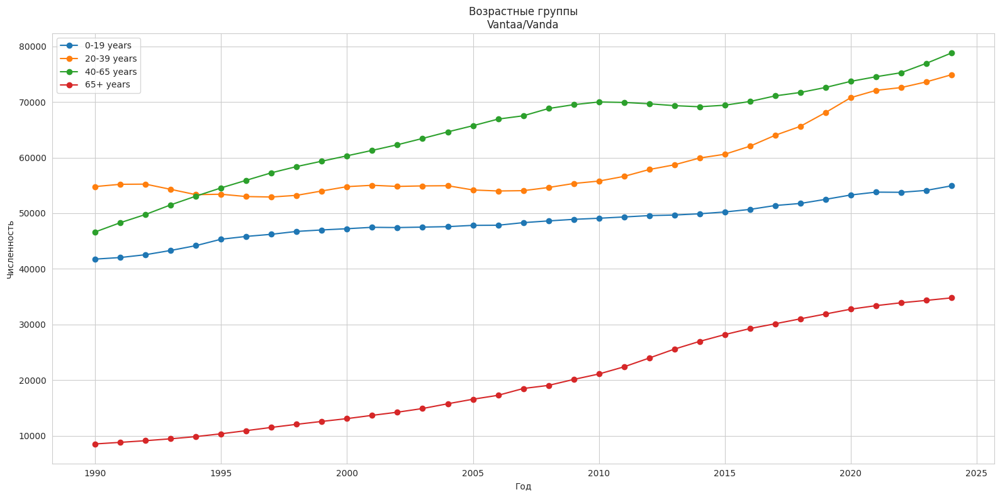

In [6]:
# Итоговая выборка городов, изучение проблем в данных

# FI005C - Espoo/Esbo
# FI001C - Helsinki/Helsingfors
# FI008C - Kuopio
# FI002C - Tampere/Tammerfors
# FI003C - Turku/Åbo
# FI006C - Vantaa/Vanda
# FI009C - Jyväskylä     - gap
# FI007C - Lahti/Lahtis  - gap
# FI004C - Oulu/Uleåborg - gap

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re

sql = MVCCSQL(BDpath = 'city_info.db')
# === Список городов ===
city_ids = [
    'FI005C', 'FI001C', 'FI008C', 'FI002C', 'FI003C', 'FI006C', 'FI009C', 'FI007C', 'FI004C',
]
print(f"City count:{len(city_ids)}")

# Преобразуем в строку для SQL
city_ids_str = ', '.join(f"'{cid}'" for cid in city_ids)

# === SQL-запрос: получить данные только для выбранных городов и total ===
query = f"""
    SELECT 
        euc.year,
        euc.value,
        lcc.city_name,
        lcc.city_id,
        pc.label
    FROM estat_urb_cpop1 AS euc
    JOIN lau_code_city AS lcc ON euc.city_id = lcc.city_id
    JOIN variable_code AS pc ON euc.variable_code_id = pc.code_id
    WHERE 
        euc.value IS NOT NULL
    --    AND euc.year BETWEEN 1989 AND 2024  -- или 1989–2024, уточните
        AND lcc.city_id IN ({city_ids_str})
        AND pc.label LIKE '%total%'
    ORDER BY lcc.city_name, euc.year
"""

df = sql.sql_to_df(query)
print(f"Current head" + "-" *10)
print(df.head(15))
print(f"-" *10 + "\n")

df['label'] = df['label'].str.strip()

df_total = df[df['label'] == 'total'].copy()
total_by_year = df_total.groupby(['city_name', 'city_id', 'year'])['value'].sum().reset_index()
total_by_year.rename(columns={'value': 'total_population'}, inplace=True)

print(f"total group(city, year) Shape:{total_by_year.shape} " + "-" *10)
print(total_by_year.head(10))
print(f"-" *10 + "\n")

# === По возрастным группам
grouped_by_age = df.copy()
age_groups = grouped_by_age['label'].unique()
age_groups = age_groups[age_groups != 'total']

print(f"По возрастным группам (len {len(age_groups)}) " + "-" *10)
print(age_groups)
print(f"-" *10 + "\n")

# =================================================
# Определим маппинг один раз вне цикла
age_mapping = {
    "0-19 years":  ["0-4 years, total",   "5-9 years, total", "10-14 years, total", "15-19 years, total"],
    "20-39 years": ["20-24 years, total", "25-29 years, total", "30-34 years, total", "35-39 years, total"],
    "40-65 years": ["40-44 years, total", "45-49 years, total", "50-54 years, total", "55-59 years, total", "60-64 years, total"],
    '65+ years': ["65-69 years, total", "70-74 years, total", "75-79 years, total", 
                  "80-84 years, total", "85-89 years, total", "90-94 years, total", 
                  "95-99 years, total", "100+ years, total"]
}
# age_mapping = {
#     '0-14 years': ["0-4 years, total", "5-9 years, total", "10-14 years, total"],
#     '15-24 years': ["15-19 years, total", "20-24 years, total"],
#     '25-34 years': ["25-29 years, total", "30-34 years, total"],
#     '35-44 years': ["35-39 years, total", "40-44 years, total"],
#     '45-54 years': ["45-49 years, total", "50-54 years, total"],
#     '55-64 years': ["55-59 years, total", "60-64 years, total"],  # если есть
#     '65+ years': ["65-69 years, total", "70-74 years, total", "75-79 years, total", 
#                   "80-84 years, total", "85-89 years, total", "90-94 years, total", 
#                   "95-99 years, total", "100+ years, total"]  # корректируйте по вашим данным
# }

# все нужные label в один список (для фильтрации)
all_labels_needed = []
for labels in age_mapping.values():
    all_labels_needed.extend(labels)

# Оставляем только нужные строки
df_filtered = df[df['label'].isin(all_labels_needed)].copy()

# Создаём столбец с новой группой
def map_label_to_group(label):
    for group_name, labels in age_mapping.items():
        if label in labels:
            return group_name
    return None

df_filtered['broad_group'] = df_filtered['label'].apply(map_label_to_group)

grouped_by_age_grp = df_filtered.groupby(['city_name', 'city_id', 'year', 'broad_group'])['value'].sum().reset_index()

# === Построение графиков ===
sns.set_style("whitegrid")
cities = total_by_year['city_name'].unique()

cmap = plt.colormaps['hsv'].resampled(len(age_groups))
colors = cmap(range(len(age_groups)))

for city in cities:
    # Фильтруем данные для города
    print(city)
    pop_total = total_by_year[total_by_year['city_name'] == city]
    pop_by_age = grouped_by_age[grouped_by_age['city_name'] == city]
    pop_by_age_grp = grouped_by_age_grp[grouped_by_age_grp['city_name'] == city]
    
    # === График 1: общая динамика ===
    plt.figure(figsize=(16, 8))
    
    plt.subplot(1, 2, 1)
    plt.plot(pop_total['year'], pop_total['total_population'], marker='o', color='black')
    plt.title(f'Общая численность населения\n{city}')
    plt.xlabel('Год')
    plt.ylabel('Численность')
    plt.grid(True)
    
    # === График 2: по возрастным группам ===
    plt.subplot(1, 2, 2)
    
    for i, group in enumerate(age_groups):
        subset = pop_by_age[pop_by_age['label'] == group]
        if not subset.empty:
            color = colors[i] 
            plt.plot(subset['year'], subset['value'], marker='o', label=group, color=color)
    
    plt.title(f'Возрастные группы\n{city}')
    plt.xlabel('Год')
    plt.ylabel('Численность')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    # plt.savefig(f"pic/demography_{city.replace('/', '_')}.png", dpi=150)
    plt.show()
    
    plt.figure(figsize=(10, 6))
    
    # --------------------------------------------
    # === График 3: только укрупнённые группы (на отдельном изображении) ===
    plt.figure(figsize=(16, 8))
    
    for i, group in enumerate(age_groups):
        subset = pop_by_age[pop_by_age['label'] == group]
        if not subset.empty:
            color = colors[i]  
            plt.plot(subset['year'], subset['value'], marker='o', label=group, color=color)
    
    plt.title(f'Возрастные группы\n{city}')
    plt.xlabel('Год')
    plt.ylabel('Численность')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    # plt.savefig(f"pic/demography_{city.replace('/', '_')}_detailed.png", dpi=150)
    plt.show()

    # --------------------------------------------
    # === График 4: только укрупнённые группы (на отдельном изображении) ===
    plt.figure(figsize=(16, 8))
    
    for i, group in enumerate(age_mapping.keys()):
        subset = pop_by_age_grp[pop_by_age_grp['broad_group'] == group]
        if not subset.empty:
            color = colors[i]  
            plt.plot(subset['year'], subset['value'], marker='o', label=group)
    
    plt.title(f'Возрастные группы\n{city}')
    plt.xlabel('Год')
    plt.ylabel('Численность')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    # plt.savefig(f"pic/demography_{city.replace('/', '_')}_broad.png", dpi=150)
    plt.show()


Подозрительные скачки (>0.14% роста):
         city_name city_id  year     value  growth_rate
89       Jyväskylä  FI009C  2009  128028.0     0.499122
166   Lahti/Lahtis  FI007C  2016  118743.0     0.144467
198  Oulu/Uleåborg  FI004C  2013  190847.0     0.326164


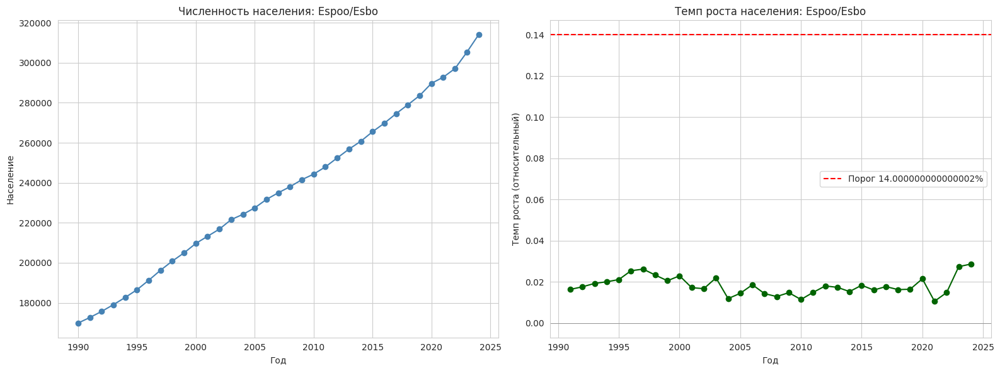

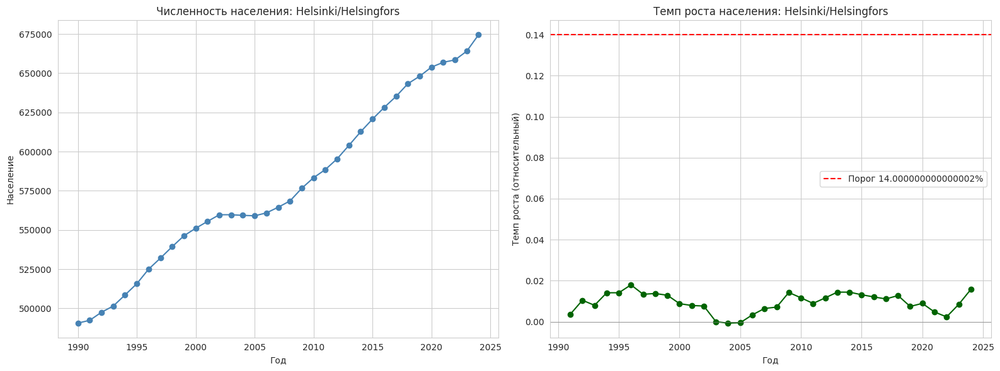

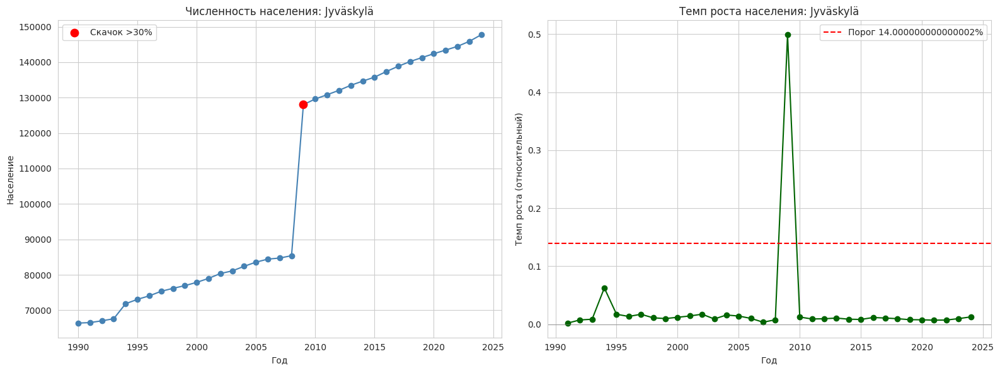

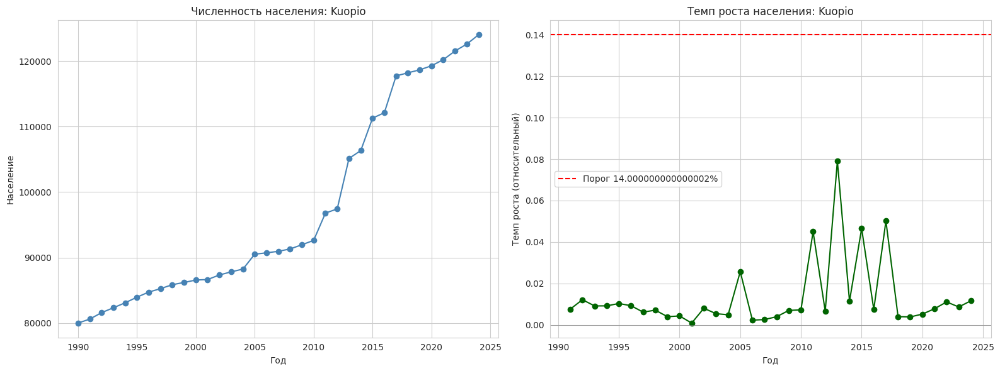

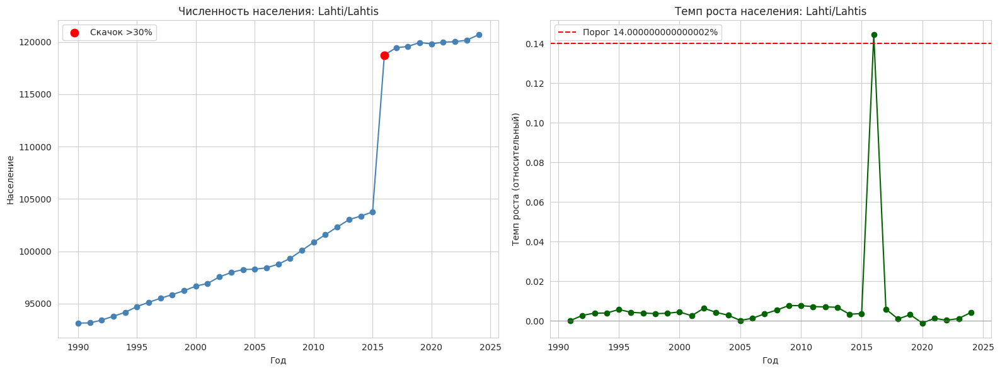

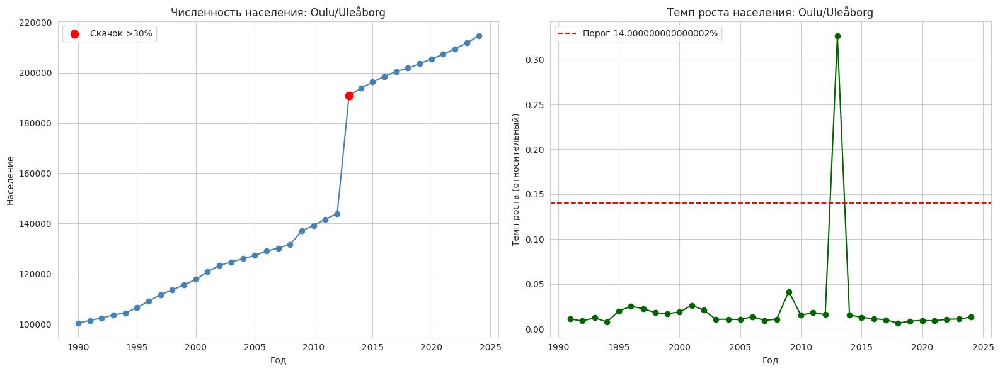

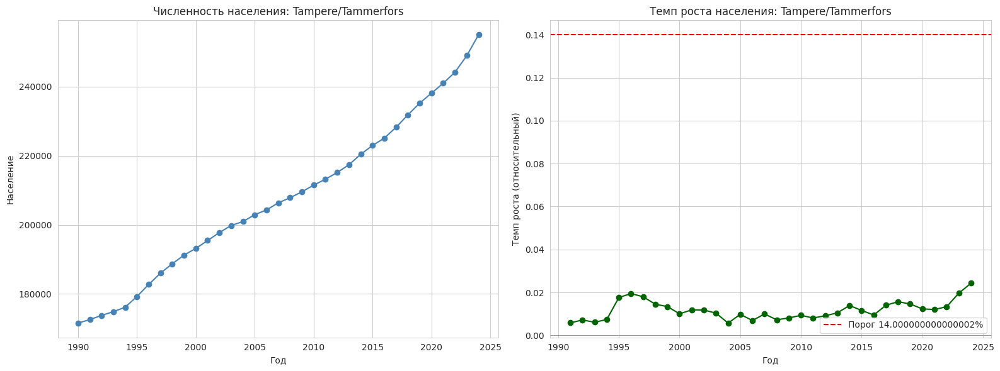

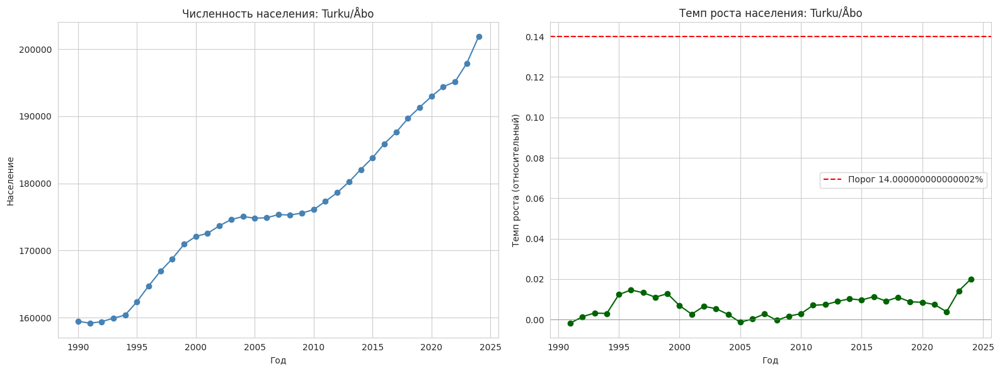

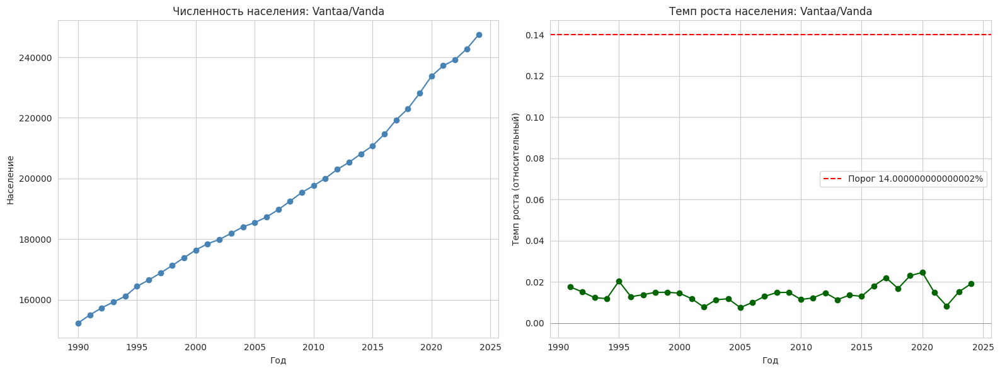

In [7]:
# исследование городов с резким скачком количество населения

# -------------------------    Ювяскюля (Jyväskylä) -------------------------
# Ювяскюля известен как "Афины Финляндии" из-за большого количества учебных заведений.
# Важно учитывать роль города как центра деревообрабатывающей и металлообрабатывающей промышленности.

# Резкий рост:
#     В 2008 году население Ювяскюля увеличилось на 50.48%. Это связано с присоединением сельской местности к городу.


# -------------------------    Лахти/Лахтис (Lahti/Lahtis) -------------------------
# В прошлом Лахти/Лахтис был индустриальным центром.
# В настоящее время является экологически чистым городом и лидером в области охраны окружающей среды.

# Резкий рост:
#     В предоставленных источниках нет информации о резком росте населения Лахти.


# -------------------------    Оулу/Улеаборг (Oulu/Uleåborg) -------------------------
# Это современный технологический и университетский центр, известный своими инновациями, но также и тем,
# что он был выбран культурной столицей Европы в 2026 году

# # Резкий рост:
#     это крупный университетский и технологический центр на севере Финляндии.
#     Точные данные о росте населения конкретно в 2013 году отсутствуют в предоставленной информации,
#     однако в целом для этого города характерна высокая миграция, которая является основным фактором, влияющим на демографию. 


import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Фильтрация и агрегация
df_total = df[df['label'] == 'total'].copy()
df_total = df_total.groupby(['city_name', 'city_id', 'year'])['value'].sum().reset_index()

# Убедимся, что данные отсортированы по году для каждого города
df_total = df_total.sort_values(['city_name', 'city_id', 'year']).reset_index(drop=True)

# === 1. Расчёт роста ===
# Группируем ТОЛЬКО по городу (city_name + city_id), чтобы shift работал по годам
df_total['pop_prev'] = df_total.groupby(['city_name', 'city_id'])['value'].shift(1)
df_total['growth_rate'] = (df_total['value'] - df_total['pop_prev']) / df_total['pop_prev']

# === 2. Выявление подозрительных скачков ===
threshold = 0.14  # 30%
suspicious_jumps = df_total[df_total['growth_rate'] > threshold]
print(f"Подозрительные скачки (>{threshold}% роста):")
print(suspicious_jumps[['city_name', 'city_id', 'year', 'value', 'growth_rate']])

# === 3. Визуализация для каждого города ===
cities = df_total['city_name'].unique()

for city in cities:
    pop_city = df_total[df_total['city_name'] == city].copy()
    
    # Пропустим города с недостатком данных
    if len(pop_city) < 2:
        continue
        
    plt.figure(figsize=(16, 6))
    
    # --- График 1: Абсолютная численность ---
    plt.subplot(1, 2, 1)
    plt.plot(pop_city['year'], pop_city['value'], marker='o', color='steelblue')
    plt.title(f'Численность населения: {city}')
    plt.xlabel('Год')
    plt.ylabel('Население')
    plt.grid(True)
    
    # Подсветим годы с подозрительными скачками
    jumps = pop_city[pop_city['growth_rate'] > threshold]
    if not jumps.empty:
        plt.scatter(jumps['year'], jumps['value'], color='red', s=80, zorder=5, label='Скачок >30%')
        plt.legend()
    
    # --- График 2: Темп роста ---
    plt.subplot(1, 2, 2)
    plt.plot(pop_city['year'], pop_city['growth_rate'], marker='o', color='darkgreen')
    plt.axhline(threshold, color='red', linestyle='--', label=f'Порог {threshold*100}%')
    plt.axhline(0, color='gray', linewidth=0.5)
    plt.title(f'Темп роста населения: {city}')
    plt.xlabel('Год')
    plt.ylabel('Темп роста (относительный)')
    plt.grid(True)
    plt.legend()
    
    plt.tight_layout()
    plt.show()


 Города для визуализации (9):
['Espoo/Esbo' 'Helsinki/Helsingfors' 'Jyväskylä' 'Kuopio' 'Lahti/Lahtis'
 'Oulu/Uleåborg' 'Tampere/Tammerfors' 'Turku/Åbo' 'Vantaa/Vanda']

 Строим графики для: Espoo/Esbo


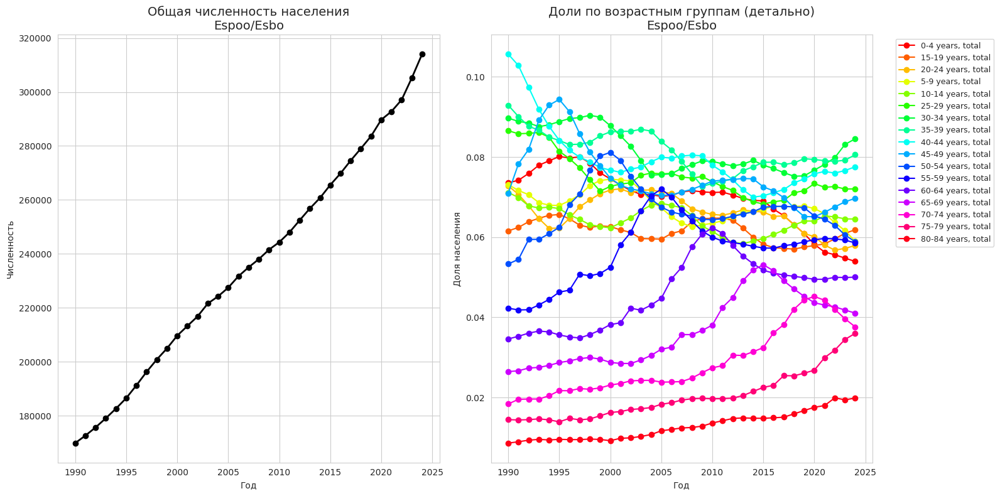

/tmp/ipykernel_6420/2872689255.py:114: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors_broad = cm.get_cmap('tab10', len(age_mapping))


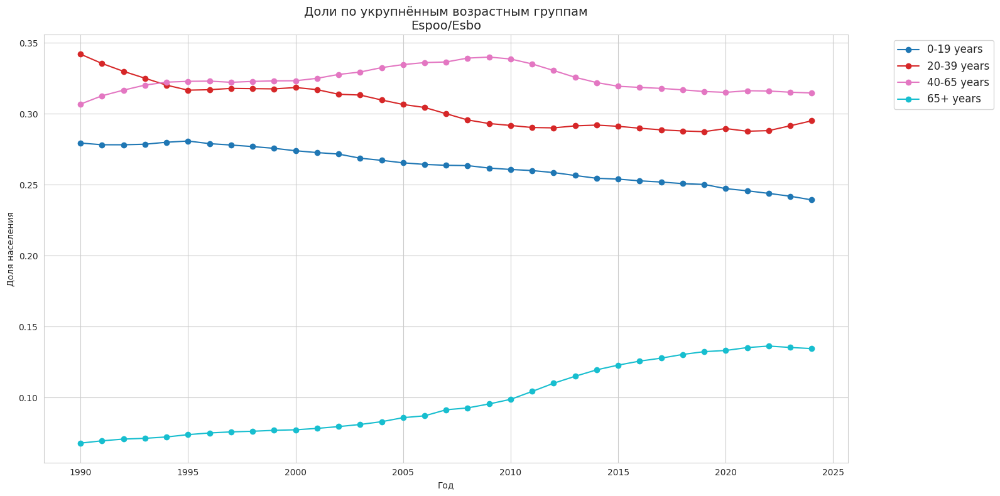


 Строим графики для: Helsinki/Helsingfors


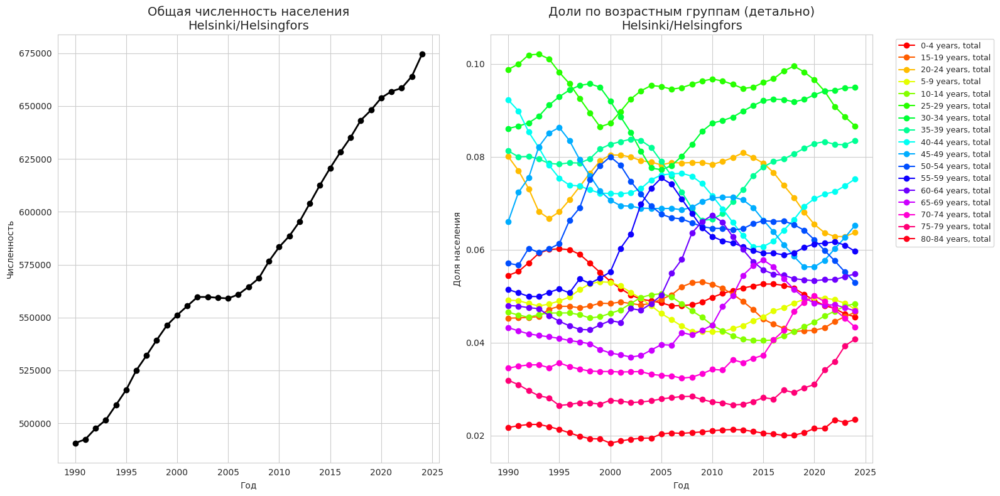

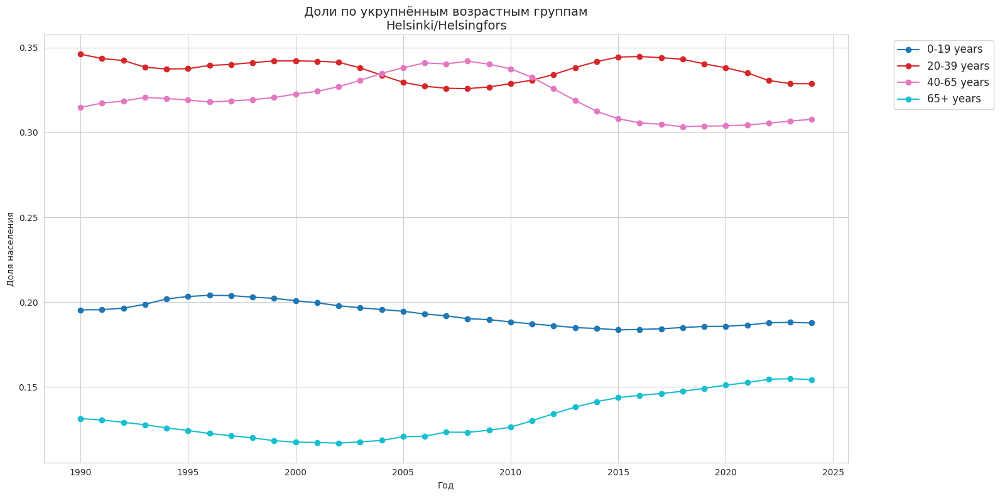


 Строим графики для: Jyväskylä


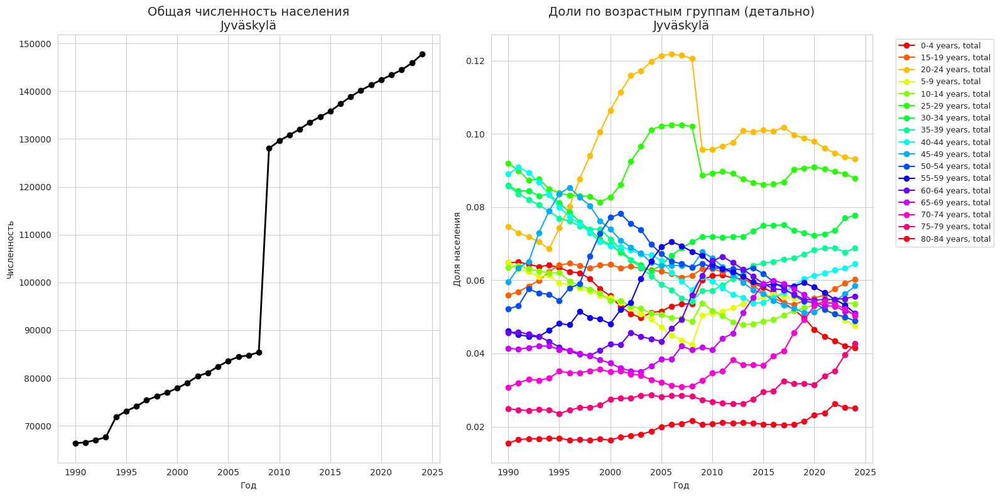

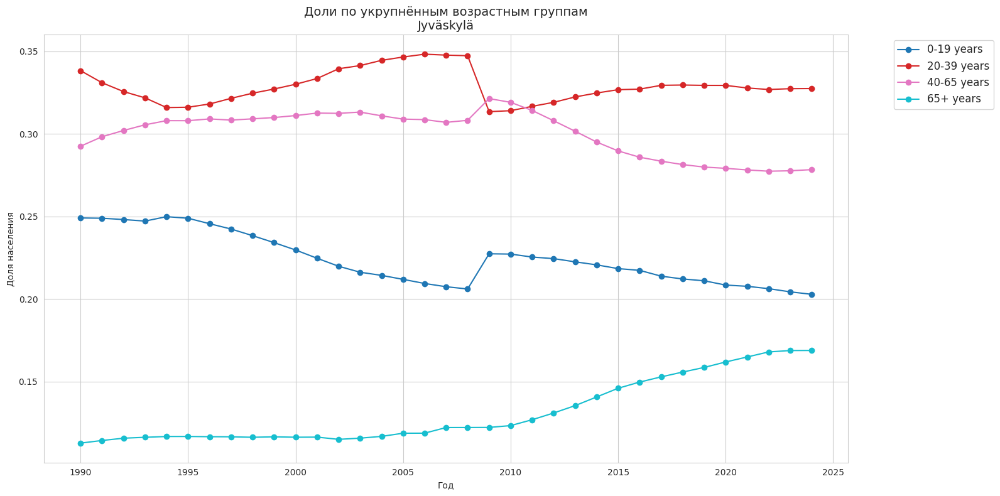


 Строим графики для: Kuopio


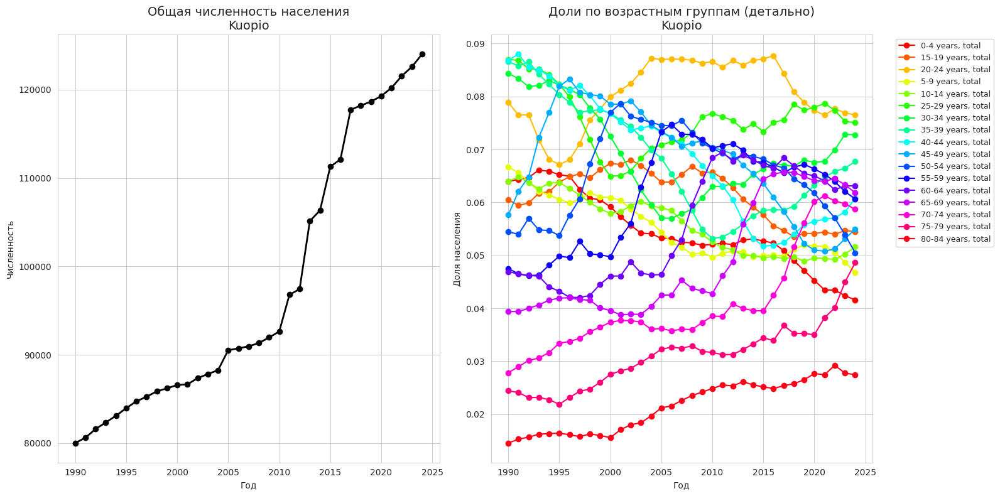

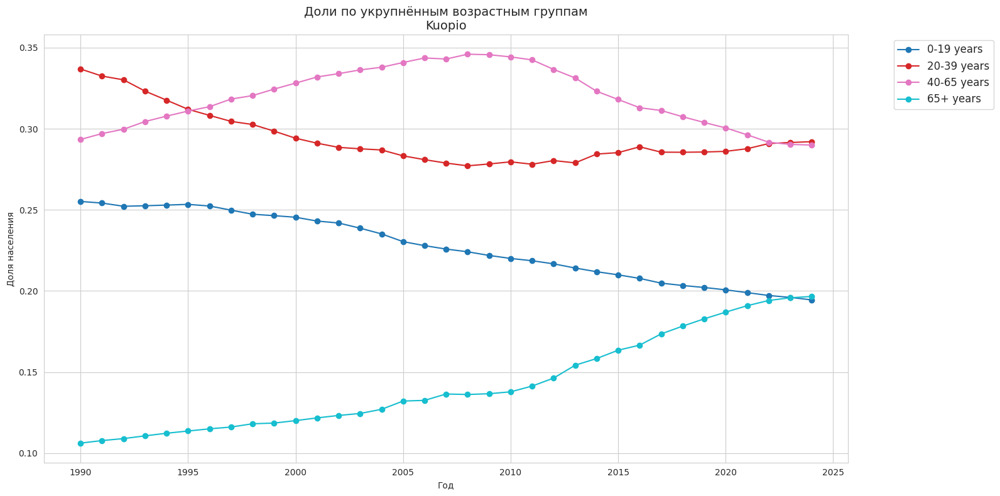


 Строим графики для: Lahti/Lahtis


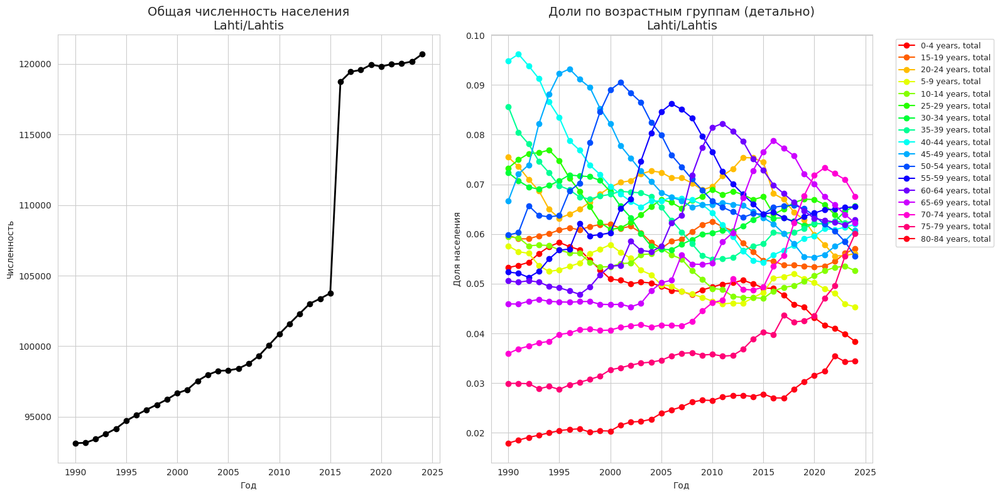

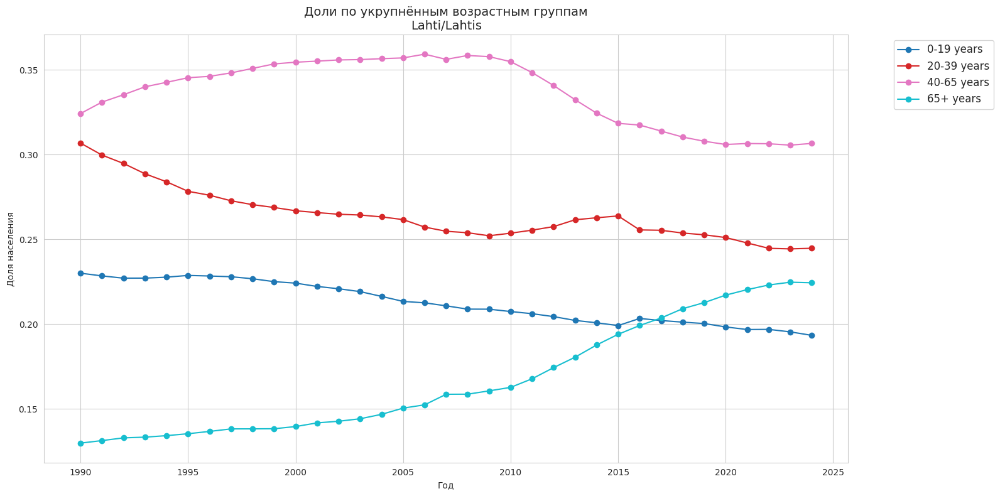


 Строим графики для: Oulu/Uleåborg


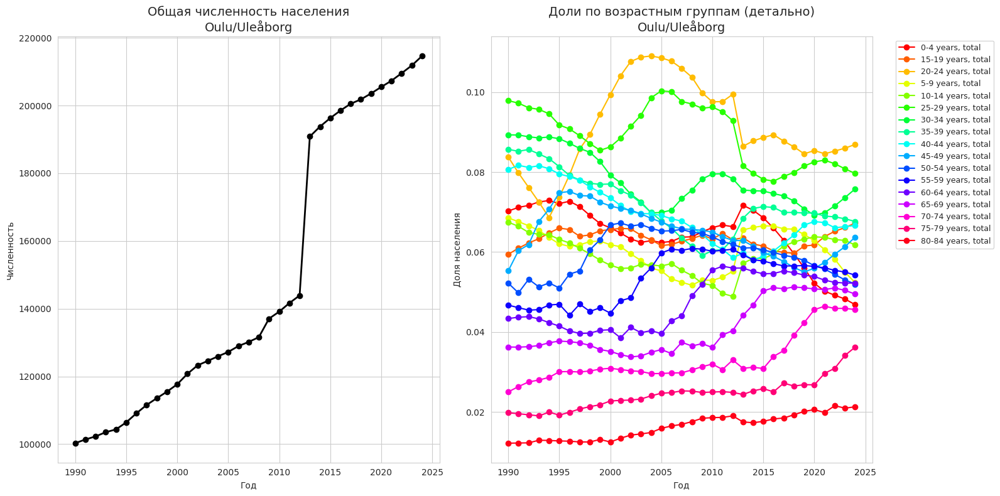

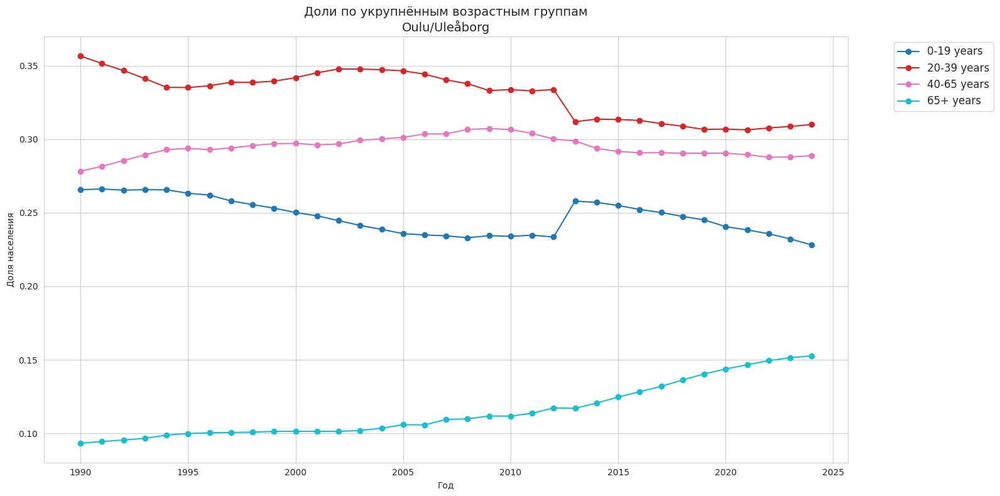


 Строим графики для: Tampere/Tammerfors


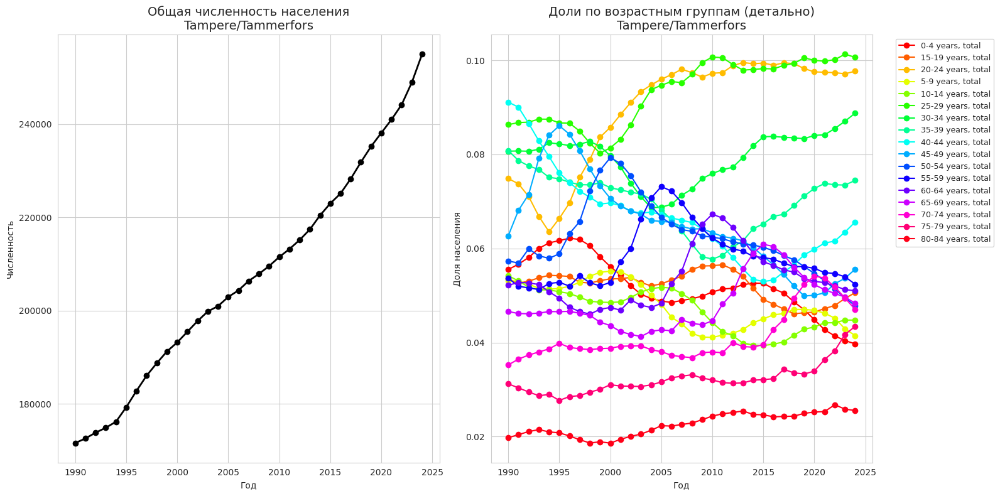

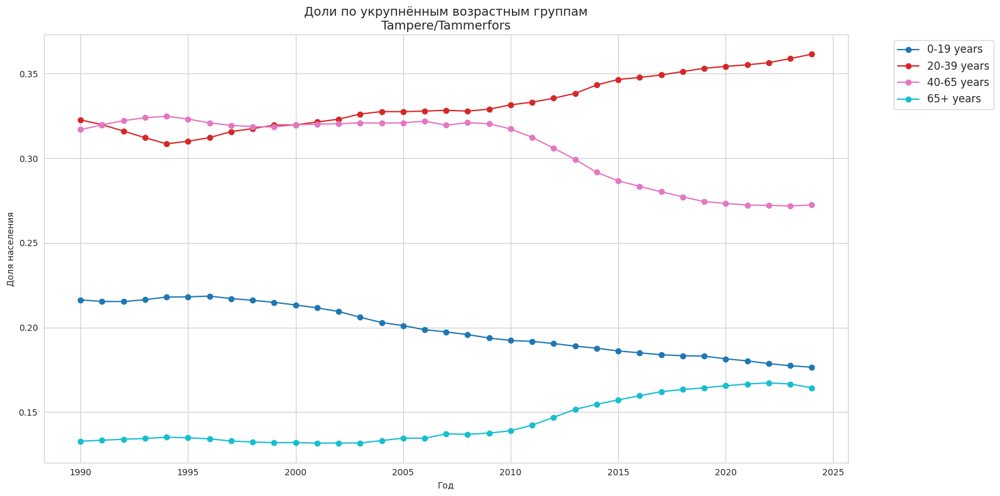


 Строим графики для: Turku/Åbo


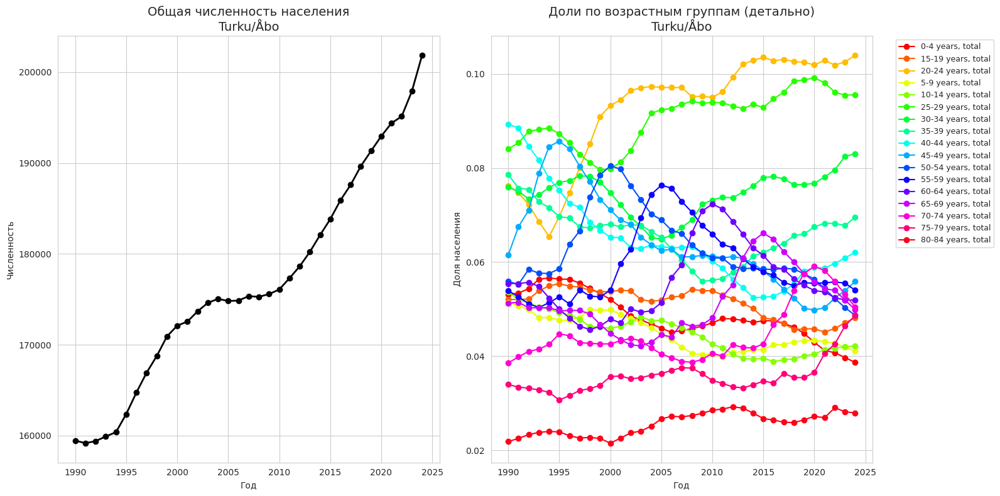

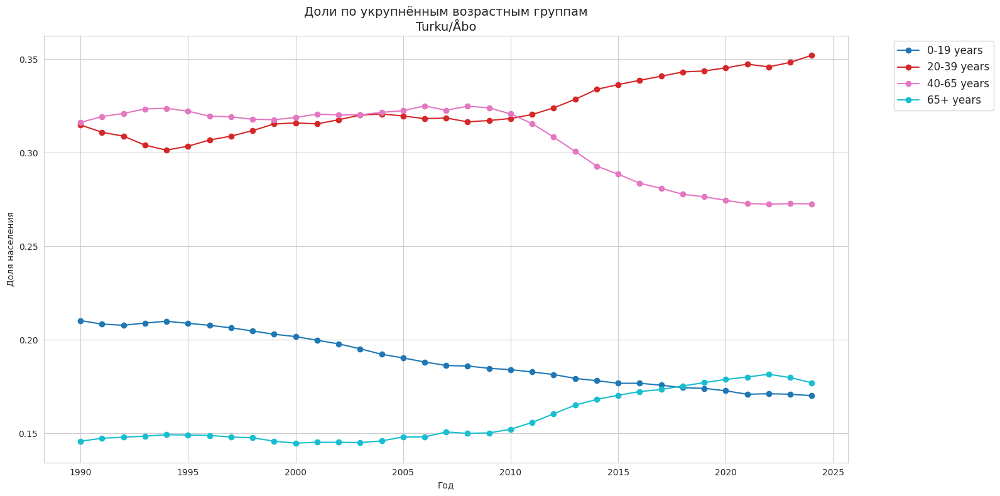


 Строим графики для: Vantaa/Vanda


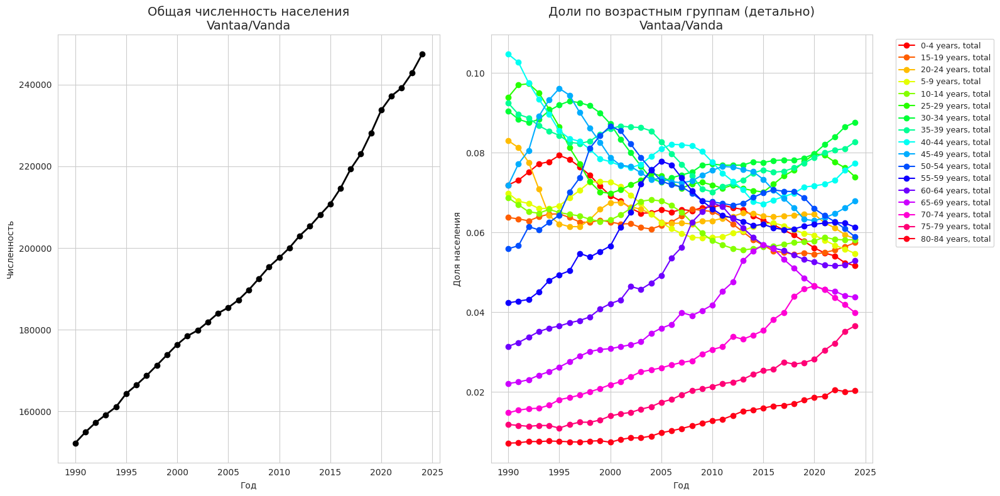

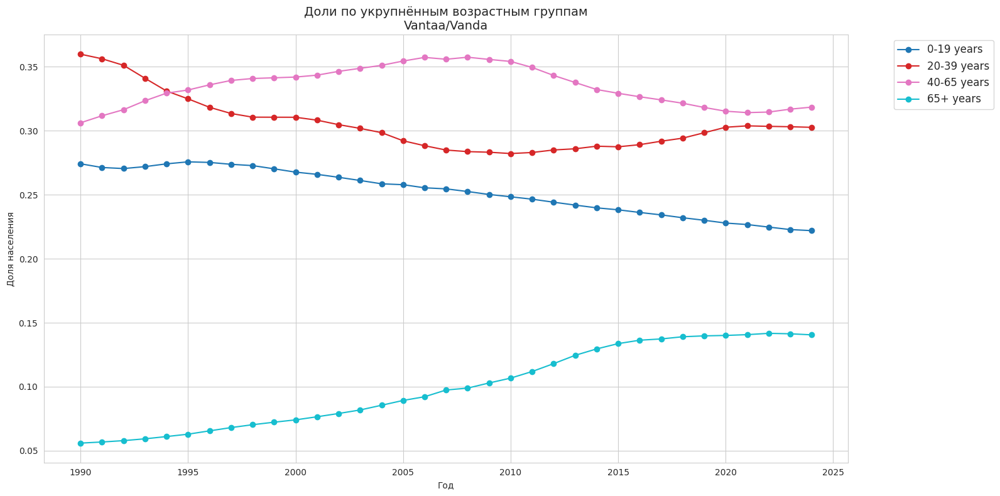

In [8]:
# Чтобы исправить ситуацию пересчитаем с количества в отношениях к общему количеству населения
# Смотрим что получилось

df = sql.sql_to_df(query)
df['label'] = df['label'].str.strip()
df['value'] = pd.to_numeric(df['value'], errors='coerce')
df = df.dropna(subset=['value'])

df_total = df[df['label'] == 'total'].copy()
df_total = df_total.groupby(['city_id', 'year'], as_index=False)['value'].sum()
df_total.rename(columns={'value': 'total_population'}, inplace=True)

# === Добавляем total к каждой строке
df_share = df.merge(df_total, on=['city_id', 'year'], how='left')
df_share['share'] = df_share['value'] / df_share['total_population']

# ===Теперь фильтруем НЕ total строки для age groups
df_non_total = df_share[df_share['label'] != 'total'].copy()

# === Определяем маппинг
age_mapping = {
    "0-19 years":  ["0-4 years, total", "5-9 years, total", "10-14 years, total", "15-19 years, total"],
    "20-39 years": ["20-24 years, total", "25-29 years, total", "30-34 years, total", "35-39 years, total"],
    "40-65 years": ["40-44 years, total", "45-49 years, total", "50-54 years, total", "55-59 years, total", "60-64 years, total"],
    '65+ years': ["65-69 years, total", "70-74 years, total", "75-79 years, total", 
                  "80-84 years, total", "85-89 years, total", "90-94 years, total", 
                  "95-99 years, total", "100+ years, total"]
}

# === Фильтруем и маппим
all_labels_needed = [lbl for group in age_mapping.values() for lbl in group]
df_filtered = df_non_total[df_non_total['label'].isin(all_labels_needed)].copy()

def map_label_to_group(label):
    for group_name, labels in age_mapping.items():
        if label in labels:
            return group_name
    return None

df_filtered['broad_group'] = df_filtered['label'].apply(map_label_to_group)

# === Агрегация ДОЛЕЙ — допустимо, потому что share — доля от одного total
grouped_by_age_grp = df_filtered.groupby(['city_name', 'city_id', 'year', 'broad_group'], as_index=False)['share'].sum()

# === Отдельно выделяем total для графика
total_by_year = df_total.merge(
    df[['city_name', 'city_id']].drop_duplicates(),
    on='city_id'
).groupby(['city_name', 'city_id', 'year'], as_index=False)['total_population'].first()

# === Возрастные группы (детализированные)
age_groups = df_filtered['label'].unique()

# -----------------------------------------------------------
# Построение графиков
# -----------------------------------------------------------
sns.set_style("whitegrid")
cities = total_by_year['city_name'].unique()

print(f"\n Города для визуализации ({len(cities)}):")
print(cities)

for city in cities:
    print(f"\n Строим графики для: {city}")
    
    # Фильтрация
    pop_total = total_by_year[total_by_year['city_name'] == city]
    pop_by_age = df_filtered[df_filtered['city_name'] == city]
    pop_by_age_grp = grouped_by_age_grp[grouped_by_age_grp['city_name'] == city]
    
    if pop_total.empty:
        print("  Нет данных об общем населении — пропускаем")
        continue

    # === График 1: Общая численность + детализированные доли ===
    plt.figure(figsize=(16, 8))

    # Левый: общая численность
    plt.subplot(1, 2, 1)
    plt.plot(pop_total['year'], pop_total['total_population'], marker='o', color='black', linewidth=2)
    plt.title(f'Общая численность населения\n{city}', fontsize=14)
    plt.xlabel('Год')
    plt.ylabel('Численность')
    plt.grid(True)

    # Правый: детализированные доли
    plt.subplot(1, 2, 2)
    cmap = plt.colormaps['hsv'].resampled(len(age_groups))
    colors_detailed = cmap(range(len(age_groups)))

    plotted = 0
    for i, group in enumerate(age_groups):
        subset = pop_by_age[pop_by_age['label'] == group]
        if not subset.empty:
            plt.plot(subset['year'], subset['share'], marker='o', label=group, color=colors_detailed[i])
            plotted += 1

    if plotted == 0:
        plt.text(0.5, 0.5, 'Нет данных', transform=plt.gca().transAxes, ha='center', fontsize=12)
    else:
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)

    plt.title(f'Доли по возрастным группам (детально)\n{city}', fontsize=14)
    plt.xlabel('Год')
    plt.ylabel('Доля населения')
    plt.grid(True)

    plt.tight_layout()
    # plt.savefig(f"pic/shares_demography_{city.replace('/', '_')}_detailed.png", dpi=150, bbox_inches='tight')
    plt.show()

    # === График 2: Укрупнённые группы ===
    plt.figure(figsize=(16, 8))
    colors_broad = cm.get_cmap('tab10', len(age_mapping))

    plotted = 0
    for i, group in enumerate(age_mapping.keys()):
        subset = pop_by_age_grp[pop_by_age_grp['broad_group'] == group]
        if not subset.empty:
            plt.plot(subset['year'], subset['share'], marker='o', label=group, color=colors_broad(i))
            plotted += 1

    if plotted == 0:
        plt.text(0.5, 0.5, 'Нет данных', transform=plt.gca().transAxes, ha='center', fontsize=12)
    else:
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

    plt.title(f'Доли по укрупнённым возрастным группам\n{city}', fontsize=14)
    plt.xlabel('Год')
    plt.ylabel('Доля населения')
    plt.grid(True)

    plt.tight_layout()
    # plt.savefig(f"pic/shares_demography_{city.replace('/', '_')}_broad.png", dpi=150, bbox_inches='tight')
    plt.show()

In [9]:
# Выводы по динамике населения городов Финляндии (на основе графиков)

# Эспоо: 
#     Чёткий пик рождаемости в 1950–60-х, сохраняющий влияние до сих пор. Второй значительный рост — с 1995 по 2005 гг. — связан с развитием Отаниеми
#     как научно-технологического центра. Графики подтверждают: рост обусловлен столичной агломерацией, внутренней миграцией и иммиграцией.

# Хельсинки:
#     Пик 1950-х — основа демографии. С 1993 г. — резкий рост студентов, совпадающий с расширением университетов.
#     Графики показывают: рост — результат не только естественного прироста, но и мощной миграции из регионов, а также роли столицы как центра бизнеса,
#     образования и культуры.

# Куопио:
#     Пик рождаемости 1950-х — основной драйвер. Рост молодёжи с 1995 г. — следствие развития университета. 
#     Однако после 2010 г. — заметный спад в возрастной группе 20–30 лет: графики подтверждают частичный отток студентов после окончания учёбы.

# Ювяскюля: 
#     Пик 1950-х — фундамент роста. Устойчивый прирост студентов с 1993 г. — отражает рост университета и приток мигрантов из других регионов.
#     Скачок в 2006 г. — визуально коррелирует с присоединением территорий, ранее бывших источником оттока, теперь — частью образовательного пространства.

# Лахти:
#     Рост 1950-х — ключевой вклад. Умеренный рост молодёжи с 1995 г. — следствие развития инфраструктуры.
#     После 2015 г. — выраженный спад: графики показывают, что после 2010 г. население предпочитает другие города,
#     рост поддерживается лишь за счёт территориальных присоединений.

# Оулу: 
#     Пик 1950-х — основа. Длительный рост студентов с 1993 по 2005 гг. — связан с развитием технологического кластера и университета.
#     Графики подтверждают: в отличие от других городов, значительная часть выпускников остаётся — город успешно трансформировался в инновационный центр.

# Тампере: Пик 1950-х — база. Рост молодёжи с 1993 г. — совпадает с развитием IT и телекоммуникаций.
#     Графики ясно демонстрируют: большинство студентов и специалистов остаются жить в городе — высокая привлекательность для проживания и занятости.

# Турку: Пик 1950-х — основа. Рост студентов с 1993 г. — следствие культурного и научного статуса. 
#     Графики показывают уникальную особенность: большинство выпускников остаются — город сочетает образование, биотехнологии,
#     порт и транспортные связи с Западом, обеспечивая устойчивое удержание населения.

# Вантаа: 
#     Пик 1950-х — историческая основа. Ключевое отличие: с 2015 г. — резкий рост в возрастных группах 20–40 лет, когда в других городах наблюдался отток.
#     Графики подтверждают: приток трудовых мигрантов и студентов компенсировал убыль — аэропорт и транспортная инфраструктура сделали Вантаа центром притяжения.


In [9]:
# подготавливаем данные для моделей

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# === 1. Загрузка и очистка данных ===
df = sql.sql_to_df(query)
df['label'] = df['label'].str.strip()
df['value'] = pd.to_numeric(df['value'], errors='coerce')
df = df.dropna(subset=['value'])

# === 2. Выделяем total и агрегируем (на случай дублей)
df_total = df[df['label'] == 'total'].copy()
df_total = df_total.groupby(['city_id', 'year'], as_index=False)['value'].sum()
df_total.rename(columns={'value': 'total_population'}, inplace=True)

# === 3. Добавляем total к каждой строке
df_share = df.merge(df_total, on=['city_id', 'year'], how='left')
df_share['share'] = df_share['value'] / df_share['total_population']

# === 4. Поворачиваем данные в wide-формат: год, город → столбцы по возрастным группам
# Убираем total из признаков
df_age = df_share[df_share['label'] != 'total'].copy()

# Создаём признаки: доля по каждой возрастной группе
pivot_df = df_age.pivot_table(
    index=['city_id', 'year'],
    columns='label',
    values='share',
    fill_value=0
).reset_index()

# Добавим total_population
pivot_df = pivot_df.merge(df_total, on=['city_id', 'year'], how='left')

# Сортировка по городу и году
pivot_df.sort_values(['city_id', 'year'], inplace=True)
pivot_df.reset_index(drop=True, inplace=True)

print("Формат wide-таблицы:")
print(pivot_df.head(5))
print(f"Размер: {pivot_df.shape}")

Формат wide-таблицы:
  city_id  year  0-4 years, total  10-14 years, total  15-19 years, total  20-24 years, total  25-29 years, total  30-34 years, total  35-39 years, total  40-44 years, total  45-49 years, total  5-9 years, total  50-54 years, total  55-59 years, total  60-64 years, total  65-69 years, total  70-74 years, total  75-79 years, total  80-84 years, total  85 years or over, total  total_population
0  FI001C  1990          0.054465            0.046540            0.045238            0.080028            0.098785            0.086081            0.081253            0.092216            0.066050          0.049129            0.057057            0.051393            0.047971            0.043220            0.034497            0.031879            0.021717                 0.012480          490629.0
1  FI001C  1991          0.055286            0.045908            0.045309            0.077031            0.099961            0.086592            0.079986            0.089866            0.07

In [10]:
# === 5. Создание признаков: лаги, разности, темпы роста ===
# Определим, на сколько лет вперёд прогнозировать
forecast_horizon = 1  # например, на 1 год вперёд

# Сгруппируем по городу и отсортируем по году
features_list = []

for city_id in pivot_df['city_id'].unique():
    city_data = pivot_df[pivot_df['city_id'] == city_id].sort_values('year').copy()
    
    # # === Лаги ===
    # # Добавим лаги для total_population
    # city_data['total_lag1'] = city_data['total_population'].shift(1)
    # city_data['total_lag2'] = city_data['total_population'].shift(2)
    
    # # === Темпы роста ===
    # city_data['growth_rate_1'] = (city_data['total_population'] - city_data['total_lag1']) / city_data['total_lag1']
    # city_data['growth_rate_2'] = (city_data['total_lag1'] - city_data['total_lag2']) / city_data['total_lag1']

    # === Целевая переменная ===
    city_data['total_future'] = city_data['total_population'].shift(-forecast_horizon)

    features_list.append(city_data)

# Объединяем все города
final_df = pd.concat(features_list, ignore_index=True)

# Удаляем строки, где нет целевой переменной (последние годы)
final_df = final_df.dropna(subset=['total_future'])

# final_df = final_df.dropna(subset=['growth_rate_1'])
# final_df = final_df.dropna(subset=['growth_rate_2'])
# final_df = final_df.dropna(subset=['total_lag1'])
# final_df = final_df.dropna(subset=['total_lag2'])

# print("Количество строк после добавления лагов и целевой переменной:", len(final_df))
# print(final_df.shape)
# coll = final_df.columns.to_list()
# for c in coll:
#     print(f"name: {c} - {final_df[c].isna().sum()}")
# print("--------------")
# for f in final_df['city_id']:
#     print(f"name: {f} - {final_df[['city_id' == f]]}")
# print("--------------")

print(final_df.head())
# print("NaN в final_df:", final_df.isna().sum())
# print("NaN в 2 final_df:", final_df.isna().sum().sum())

  city_id  year  0-4 years, total  10-14 years, total  15-19 years, total  20-24 years, total  25-29 years, total  30-34 years, total  35-39 years, total  40-44 years, total  45-49 years, total  5-9 years, total  50-54 years, total  55-59 years, total  60-64 years, total  65-69 years, total  70-74 years, total  75-79 years, total  80-84 years, total  85 years or over, total  total_population  total_future
0  FI001C  1990          0.054465            0.046540            0.045238            0.080028            0.098785            0.086081            0.081253            0.092216            0.066050          0.049129            0.057057            0.051393            0.047971            0.043220            0.034497            0.031879            0.021717                 0.012480          490629.0      492400.0
1  FI001C  1991          0.055286            0.045908            0.045309            0.077031            0.099961            0.086592            0.079986            0.089866         

In [11]:
# === 6. Подготовка признаков (X) и целевой переменной (y)
# Определим, какие столбцы использовать как признаки
exclude_cols = ['city_id', 'year', 'total_population', 'total_future']

X = final_df.drop(columns=exclude_cols)
y = final_df['total_future']

print("Признаки (X):")
print(X.columns.tolist())
print("Размер X:", X.shape)
print("Размер y:", y.shape)

# === 7. Разделение по времени (например, 80% данных — обучение)
split_year = final_df['year'].quantile(0.8)  # или задайте вручную, например 2020

train_mask = final_df['year'] <= split_year
test_mask = final_df['year'] > split_year

X_train = X[train_mask]
X_test = X[test_mask]
y_train = y[train_mask]
y_test = y[test_mask]

print(f"Train shape: X={X_train.shape}, y={y_train.shape}")
print(f"Test shape: X={X_test.shape}, y={y_test.shape}")

print("NaN в X_train:", X_train.isna().sum().sum())
print("NaN в y_train:", y_train.isna().sum())

Признаки (X):
['0-4 years, total', '10-14 years, total', '15-19 years, total', '20-24 years, total', '25-29 years, total', '30-34 years, total', '35-39 years, total', '40-44 years, total', '45-49 years, total', '5-9 years, total', '50-54 years, total', '55-59 years, total', '60-64 years, total', '65-69 years, total', '70-74 years, total', '75-79 years, total', '80-84 years, total', '85 years or over, total']
Размер X: (306, 18)
Размер y: (306,)
Train shape: X=(252, 18), y=(252,)
Test shape: X=(54, 18), y=(54,)
NaN в X_train: 0
NaN в y_train: 0


In [12]:
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def evaluate_model(y_true, y_pred, name):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)

    # Дополнительно: MAPE (Mean Absolute Percentage Error) — только если в y_true нет нулей
    y_true_np = np.asarray(y_true)
    y_pred_np = np.asarray(y_pred)

    # Проверка, чтобы избежать деления на 0
    non_zero_mask = y_true_np != 0
    if non_zero_mask.sum() > 0:
        mape = np.mean(np.abs((y_true_np[non_zero_mask] - y_pred_np[non_zero_mask]) / y_true_np[non_zero_mask])) * 100
    else:
        mape = float('nan')  # или np.nan

    print(f"Модель: {name}")
    print(f"  MAE:  {mae:.4f}")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  R²:   {r2:.4f}")
    print(f"  MAPE: {mape:.2f}%")
    print("-" * 30)

In [13]:
import logging

def SetInfoLogToFile():
    logger = logging.getLogger("optuna")
    file_handler = logging.FileHandler("optuna.log")
    file_handler.setLevel(logging.INFO)
    formatter = logging.Formatter('%(asctime)s - %(message)s - %(name)s - %(levelname)s')
    file_handler.setFormatter(formatter)
    logger.addHandler(file_handler)

    # Устанавливаем уровень WARNING только для StreamHandler (консоль)
    for handler in logger.handlers:
        if isinstance(handler, logging.FileHandler):
            handler.setLevel(logging.INFO)
        else:
            handler.setLevel(logging.WARNING)
        
    print(logger.handlers) 

In [ ]:
import optuna
import xgboost as xgb
from sklearn.metrics import mean_absolute_error

# # Проверка на NaN перед обучением и оценкой
# print("NaN в X_train:", X_train.isnull().any().any())
# print("NaN в X_test:", X_test.isnull().any().any())
# print("NaN в y_train:", y_train.isnull().any())
# print("NaN в y_test:", y_test.isnull().any())

def objective(trial):
    params = {
        'objective': 'reg:squarederror',
        'booster': trial.suggest_categorical('booster', ['gbtree', 'gblinear', 'dart']),
        'n_estimators': trial.suggest_int('n_estimators', 50, 2000),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.5, log=True),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 100.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 100.0, log=True),
        'random_state': 42,      }
    
    model = xgb.XGBRegressor(**params)
    model.fit(
        X_train, y_train,
        eval_set=[(X_test, y_test)],
        verbose=False
    )

    y_pred = model.predict(X_test)

    score = mean_absolute_error(y_test, y_pred)

    return score

study = optuna.create_study(direction='minimize')
SetInfoLogToFile()
study.optimize(objective, n_trials=200)

# Выводим лучшие параметры и значение метрики
print("Best trial value (MAE):", study.best_value)
print("Best trial params:")
for key, value in study.best_params.items():
    print(f"  {key}: {value}")
    
import json
with open('best_params_xgb.json', 'w') as f:
    json.dump(study.best_params, f, indent=4) 
print("Параметры сохранены в best_params_hgb.json")

# Используем лучшие параметры 
best_params = study.best_params
final_model = xgb.XGBRegressor(
    **best_params,
    random_state=42
)
final_model.fit(X_train, y_train, eval_set=[(X_test, y_test)], verbose=False)
y_pred_xgb_optimized = final_model.predict(X_test)
evaluate_model(y_test, y_pred_xgb_optimized, "XGBRegressor (Optimized with Optuna)")

[I 2025-11-21 10:22:16,417] A new study created in memory with name: no-name-93e0c07e-da63-43ac-b03c-7382bcb6e355


[<StreamHandler stderr (WARNING)>, <FileHandler /home/gr/ML/L2/HW1/optuna.log (INFO)>]


In [ ]:
import xgboost as xgb
# --- Загрузка ---
# Загружаем словарь из файла .json
with open('best_params_xgb.json', 'r') as f:
    loaded_best_params_xgb = json.load(f)

print("Параметры загружены из best_params_hgb.json")
print("Загруженные параметры:", loaded_best_params_xgb)

# Используем лучшие параметры для создания финальной модели
loaded_best_params_xgb['random_state'] = 42
final_model_xgb = xgb.XGBRegressor(**loaded_best_params_xgb)
final_model_xgb.fit(X_train, y_train, eval_set=[(X_test, y_test)], verbose=False)
y_pred_xgb_optimized = final_model_xgb.predict(X_test)
evaluate_model(y_test, y_pred_xgb_optimized, "XGBRegressor (Optimized with Optuna)")

In [ ]:
from xgboost import XGBRegressor

model_xgb = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=6, random_state=42)
model_xgb.fit(X_train, y_train)

y_pred_xgb = model_xgb.predict(X_test)
evaluate_model(y_test, y_pred_xgb, "XGBRegressor")

import matplotlib.pyplot as plt
importances = model_xgb.feature_importances_
feat_imp = pd.Series(importances, index=X.columns).sort_values(ascending=False)
plt.figure(figsize=(10, 6))
feat_imp.head(15).plot(kind='barh')
plt.title("Важность признаков (XGBRegressor)")
plt.xlabel("Важность")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [ ]:
import optuna
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error

def objective_gb(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500), 
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True), 
        'max_depth': trial.suggest_int('max_depth', 3, 10), 
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20), # Минимальное количество образцов для разделения узла
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20), # Минимальное количество образцов в листе
        'subsample': trial.suggest_float('subsample', 0.6, 1.0), # Доля выборки для обучения каждого дерева
        'random_state': 42 
    }

    model_gb = GradientBoostingRegressor(**params)
    model_gb.fit(X_train, y_train)

    y_pred_gb = model_gb.predict(X_test)

    score = mean_absolute_error(y_test, y_pred_gb)

    return score

study_gb = optuna.create_study(direction='minimize', study_name='GradientBoosting') # Минимизируем метрику
SetInfoLogToFile()
study_gb.optimize(objective_gb, n_trials=200)

# Выводим лучшие параметры и значение метрики
print("GradientBoostingRegressor Best trial value (MAE):", study_gb.best_value)
print("GradientBoostingRegressor Best trial params:")
for key, value in study_gb.best_params.items():
    print(f"  {key}: {value}")

import json
with open('best_params_gb.json', 'w') as f:
    json.dump(study_gb.best_params, f, indent=4) # indent для читаемости
print("Параметры сохранены в best_params_hgb.json")

# Используем лучшие параметры
best_params_gb = study_gb.best_params
best_params_gb['random_state'] = 42
final_model_gb = GradientBoostingRegressor(**best_params_gb)
final_model_gb.fit(X_train, y_train) 
y_pred_gb_optimized = final_model_gb.predict(X_test)
evaluate_model(y_test, y_pred_gb_optimized, "GradientBoostingRegressor (Optimized with Optuna)")

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

with open('best_params_gb.json', 'r') as f:
    loaded_best_params_gb = json.load(f)

print("Параметры загружены из best_params_gb.json")
print("Загруженные параметры:", loaded_best_params_gb)

# Используем лучшие параметры
loaded_best_params_gb['random_state'] = 42
final_model_gb = GradientBoostingRegressor(**loaded_best_params_gb)
final_model_gb.fit(X_train, y_train) 
y_pred_gb_optimized = final_model_gb.predict(X_test)
evaluate_model(y_test, y_pred_gb_optimized, "GradientBoostingRegressor (Optimized with Optuna)")

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

model_gb = GradientBoostingRegressor(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=6,
    random_state=42
)
model_gb.fit(X_train, y_train)

y_pred_gb = model_gb.predict(X_test)
evaluate_model(y_test, y_pred_gb, "GradientBoostingRegressor")

import matplotlib.pyplot as plt
importances = model_gb.feature_importances_
feat_imp = pd.Series(importances, index=X.columns).sort_values(ascending=False)
plt.figure(figsize=(10, 6))
feat_imp.head(15).plot(kind='barh')
plt.title("Важность признаков (GradientBoostingRegressor)")
plt.xlabel("Важность")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()



In [ ]:
import optuna
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.metrics import mean_absolute_error

def objective_gb(trial):
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True), 
        'max_iter': trial.suggest_int('max_iter', 100, 1000), 
        'max_depth': trial.suggest_int('max_depth', 3, 15), 
        'max_leaf_nodes': trial.suggest_int('max_leaf_nodes', 10, 255), 
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 10, 200), 
        'l2_regularization': trial.suggest_float('l2_regularization', 1e-10, 10.0, log=True), 
        'max_bins': trial.suggest_int('max_bins', 128, 255), 
        'random_state': 42 
    }

    model_hgb = HistGradientBoostingRegressor(**params)
    model_hgb.fit(X_train, y_train)

    y_pred_hgb = model_hgb.predict(X_test)

    score = mean_absolute_error(y_test, y_pred_hgb)

    return score

study_hgb = optuna.create_study(direction='minimize', study_name='GradientBoosting') 
SetInfoLogToFile()
study_hgb.optimize(objective_gb, n_trials=200)

# Выводим лучшие параметры и значение метрики
print("HistGradientBoostingRegressor Best trial value (MAE):", study_hgb.best_value)
print("GradientBoostHistGradientBoostingRegressoringRegressor Best trial params:")
for key, value in study_hgb.best_params.items():
    print(f"  {key}: {value}")

best_params_hgb = study_hgb.best_params

import json
with open('best_params_hgb.json', 'w') as f:
    json.dump(best_params_hgb, f, indent=4) 
print("Параметры сохранены в best_params_hgb.json")

best_params_hgb['random_state'] = 42
final_model_hgb = HistGradientBoostingRegressor(**best_params_hgb)
final_model_hgb.fit(X_train, y_train) 
y_pred_hgb_optimized = final_model_hgb.predict(X_test)
evaluate_model(y_test, y_pred_hgb_optimized, "HistGradientBoostingRegressor (Optimized with Optuna)")

In [ ]:
from sklearn.ensemble import HistGradientBoostingRegressor
with open('best_params_hgb.json', 'r') as f:
    loaded_best_params_hgb = json.load(f)

print("Параметры загружены из best_params_hgb.json")
print("Загруженные параметры:", loaded_best_params_hgb)

loaded_best_params_hgb['random_state'] = 42
final_model_hgb = HistGradientBoostingRegressor(**loaded_best_params_hgb)
final_model_hgb.fit(X_train, y_train) 
y_pred_hgb_optimized = final_model_hgb.predict(X_test)
evaluate_model(y_test, y_pred_hgb_optimized, "HistGradientBoostingRegressor (Optimized with Optuna)")

In [ ]:

from sklearn.ensemble import HistGradientBoostingRegressor

model_hgb = HistGradientBoostingRegressor(
    random_state=42,
    max_iter=100,
    learning_rate=0.1
)

model_hgb.fit(X_train, y_train)

# Предсказание
y_pred_hgb = model_hgb.predict(X_test)
evaluate_model(y_test, y_pred_hgb, "HistGradientBoostingRegressor")

import matplotlib.pyplot as plt
importances = model_gb.feature_importances_
feat_imp = pd.Series(importances, index=X.columns).sort_values(ascending=False)
plt.figure(figsize=(10, 6))
feat_imp.head(15).plot(kind='barh')
plt.title("Важность признаков (HistGradientBoostingRegressor)")
plt.xlabel("Важность")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


In [ ]:
evaluate_model(y_test, y_pred_xgb, "XGBRegressor")
evaluate_model(y_test, y_pred_xgb_optimized, "XGBRegressor (Optimized with Optuna)")

evaluate_model(y_test, y_pred_gb, "GradientBoostingRegressor")
evaluate_model(y_test, y_pred_gb_optimized, "GradientBoostingRegressor (Optimized with Optuna)")

evaluate_model(y_test, y_pred_hgb, "HistGradientBoostingRegressor")
evaluate_model(y_test, y_pred_hgb_optimized, "HistGradientBoostingRegressor (Optimized with Optuna)")


